# Forecasting Bitcoin closing price series

# Introduction

Time series forecasting is one of the most widely used data science techniques in business and finance to make future strategic decisions.

In this project we will forecast daily closing price series of [Bitcoin](https://coinmarketcap.com/currencies/bitcoin/), a peer-to-peer online currency, using the historical price of Bitcoin.

We will follow different approaches to time series forecasting, implementing both statistical techniques and machine learning algorithms.

We will start with classical approaches to time series forecasting, including moving averages, exponential smoothing methods and the
ARIMA (AutoRegressive Integrated Moving Average) model.

We will then use Tensorflow to build a number of artificial neural networks (including Linear, CNN and RNN models) with multivariate time series.s features.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import pmdarima as pm
import statsmodels.api as sm

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers,callbacks

import time
from datetime import datetime
import warnings

# Plots
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import colorlover as cl

import yfinance as yf

## Get data

We can request historic pricing data via [yfinance API](https://pypi.org/project/yfinance/) which offers a pythonic way to download market data as follows.

In [2]:
import yfinance as yf

bitcoin_prices = yf.Ticker('BTC-USD').history(period='max',interval="1d")[['Close', 'Open', 'High','Low', 'Volume']]\
                   .rename(columns={'Close':'Price'}).reset_index()
bitcoin_prices["Date"] = pd.to_datetime(bitcoin_prices["Date"]).dt.tz_localize(None)
bitcoin_prices = bitcoin_prices.set_index("Date")

# As the upward trend is almost absent before 2018, we exclude earlier dates.
bitcoin_prices = bitcoin_prices[bitcoin_prices.index > datetime(2018,1,1)] 
bitcoin_prices = bitcoin_prices[bitcoin_prices.index < datetime(2023,11,10)]

bitcoin_prices.tail()

,Price,Open,High,Low,Volume
Date,,,,,
2023-11-05,35049.355469,35090.011719,35340.339844,34594.242188,12412743996
2023-11-06,35037.371094,35044.789062,35286.027344,34765.363281,12693436420
2023-11-07,35443.562500,35047.792969,35892.417969,34545.816406,18834737789
2023-11-08,35655.277344,35419.476562,35994.417969,35147.800781,17295394918
2023-11-09,36693.125000,35633.632812,37926.257812,35592.101562,37762672382


# Time Series analysis

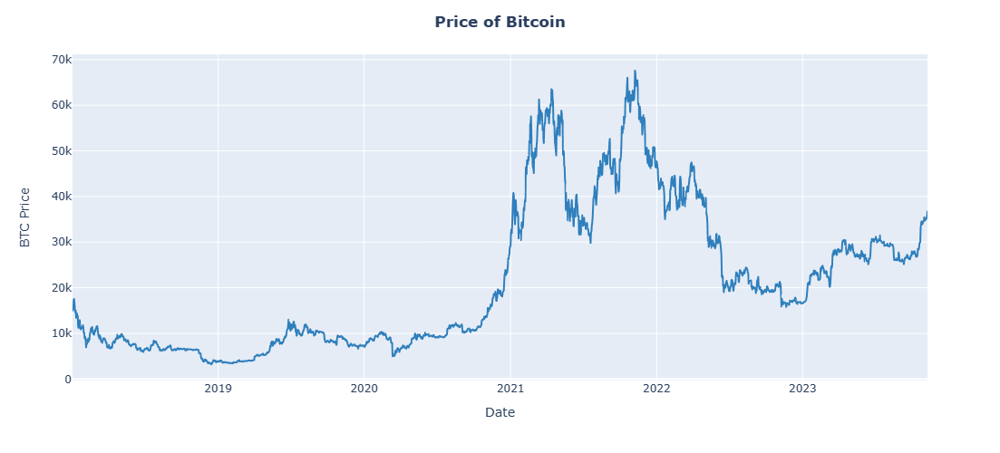

In [3]:
fig = px.line(x=bitcoin_prices.index, y='Price',data_frame=bitcoin_prices, 
              height=500,
              labels={
                     "Date": "Date",
                     "Price": "BTC Price"
                 }
             )

fig.update_traces(line_color='#2F7FBC', line_width=2)
fig.update_layout(title_text="<b>Price of Bitcoin</b>", title_x=0.5)
fig.show();

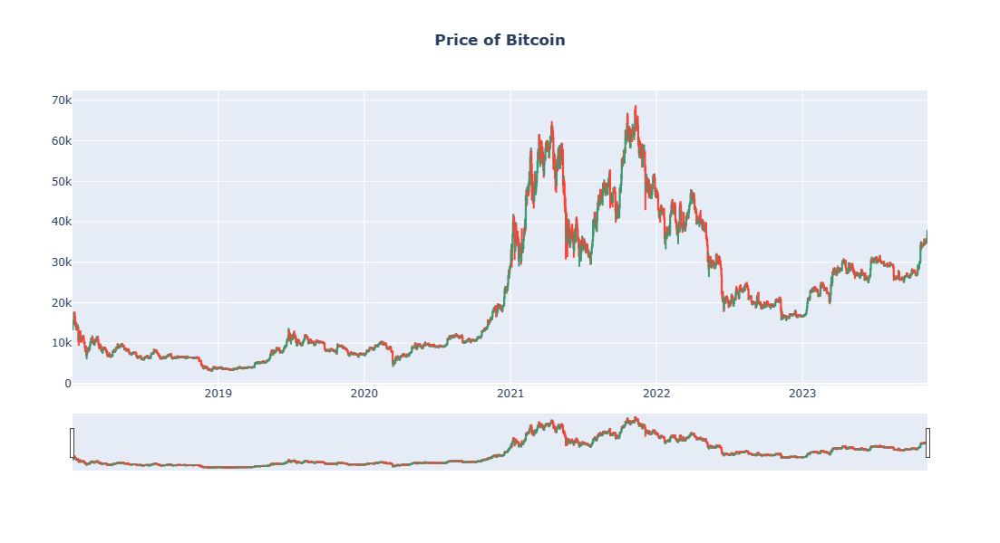

In [4]:
# Simple Candlestick with Plotly: https://plotly.com/python/candlestick-charts/

import plotly.graph_objects as go

fig = go.Figure(data=[go.Candlestick(x=bitcoin_prices.index,
                open=bitcoin_prices['Open'],
                high=bitcoin_prices['High'],
                low=bitcoin_prices['Low'],
                close=bitcoin_prices['Price'])])

# fig.update_traces(line_color='#2F7FBC', line_width=2,height=500)
fig.update_layout(title_text="<b>Price of Bitcoin</b>", title_x=0.5,height=600)
fig.show();

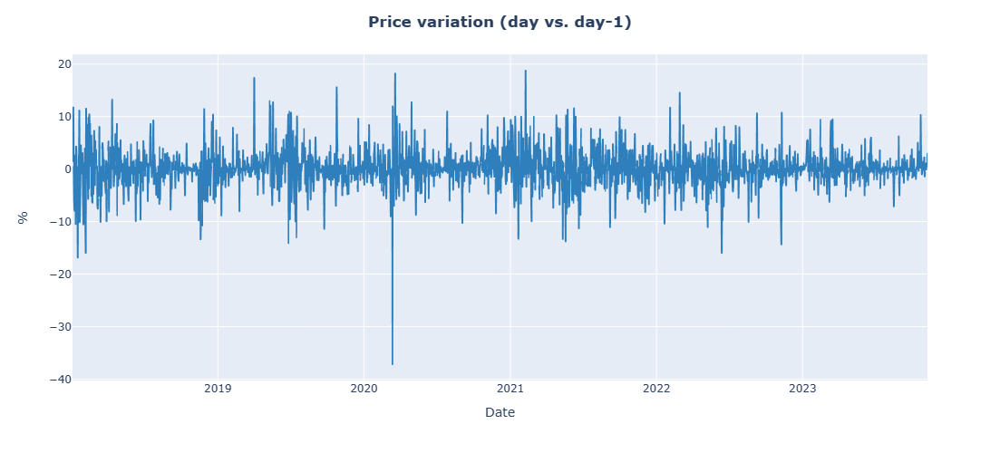

In [5]:
# Price variation (day vs. day-1)
prices = bitcoin_prices['Price'].values

fig = px.line(x=bitcoin_prices.index[1:], 
              y=100*(prices[1:] - prices[:-1])/prices[:-1],
              labels={"x": "Date","y": "%"})

fig.update_traces(line_color='#2F7FBC', line_width=2)
fig.update_layout(title_text="<b>Price variation (day vs. day-1)</b>", title_x=0.5,height=500)
fig.show();

The above graphs show no clear trend or seasonality.

Since 2018, the trend seems to change over time. There is a spectacular increase from October 2020 to November 2021 (from 11K to 65K), before a decrease is observed until June 2022. A new increase is observed in 2023. 

We will consider whether a trended method (namely the Holt model) would be better for this series later on.

As our series is a non-seasonal data, we will restrict our attention to non-seasonal ARIMA models.

# Train_test_split

Before we delve into the various methods we will be using to forecast the BTC closing price, let's first split our data set (bitcoin_prices) into **sequential** train and test subsets.

Note that the test subset will be used to evaluate all of our models. So the comparison will be fair.

- The training dataset is only used to train our deep learning models with Tensorflow.
- For the other methods (Naive, Exponontial Smoothing...), in order to predict the price at time $t$, a window of the previous data points is needed. The size of the window depends on the model. For example, the Naive method requires only the price at time $t-1$.\
More details on window specifications are given in the next sections.

In [9]:
# Splits the data into training and validation sets.

SPLIT_TIME = int(len(bitcoin_prices) * 0.8) 
train_data = bitcoin_prices[:SPLIT_TIME] # will be used by deep learning models
test_data = bitcoin_prices[SPLIT_TIME:-14] # used to evaluate all our models
val_data = bitcoin_prices[-14:] # compare our 14-days forecasts to real data
NEXT_DATES = val_data.index 

y_train = train_data['Price'].values
y_test = test_data['Price'].values
y_val = val_data['Price'].values

print(f"{len(y_train)} train samples")
print(f"{len(y_test)} test samples")
print(f"{len(y_val)} test samples")

1710 train samples
414 test samples
14 test samples


# Baseline : Naive Forecasting

Naive Forecasting is a simple model. It could provide a good baseline for future models.

It uses the previous timestep value (last day in our case) to predict the next one. The formula can be written as follows:

$$\hat{y}_{t} = y_{t-1}$$ 

### Plot Naive forecasts

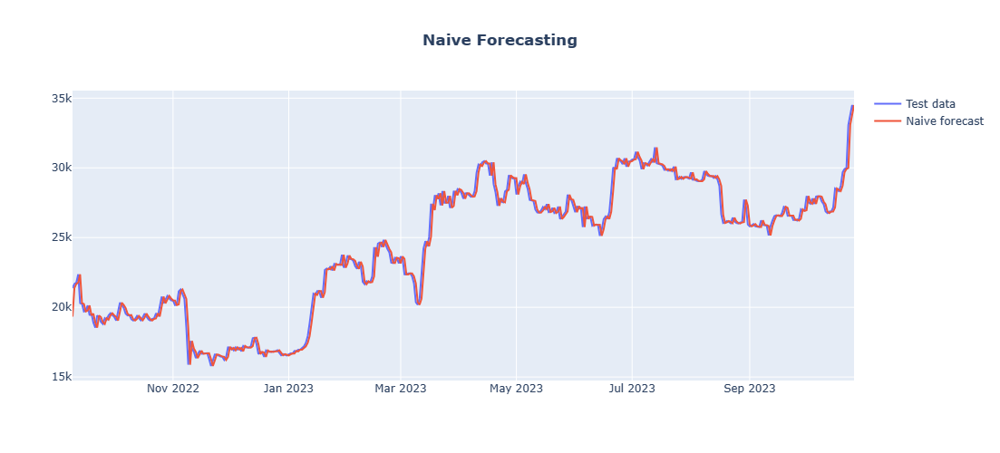

In [10]:
y_naive = test_data['Price'][:-1]

# Plot Naive forecasts
fig = go.Figure()
fig.add_trace(go.Scatter(x=test_data['Price'][1:].index, y=y_test[1:], name='Test data'))
fig.add_trace(go.Scatter(x=test_data['Price'][1:].index, y=y_naive.values, name='Naive forecast') )
fig.update_layout(title_text=f"<b>Naive Forecasting</b>",title_x=0.5,height=500)

If we zoom in, we can see that the Naive forecast lags one step behind the time series.

Let's evaluate this model.

### Evaluate the model

In [11]:
from sklearn.metrics import mean_squared_error,mean_absolute_error,mean_absolute_percentage_error,r2_score

def evaluate_model(y_test, forecasts,model_name,precision=4,show_results=True):
    '''Evaluate the model using the following metrics:
    1. MAE and RMSE: metrics on the same scale at time series data
    2. MAPE (mean absolute percentage error): percentage errors    
    '''
    RMSE = np.sqrt(mean_squared_error(y_test, forecasts))
    MAE = mean_absolute_error(y_test, forecasts)
    MAPE = mean_absolute_percentage_error(y_test, forecasts)
    R2_score = r2_score(y_test, forecasts)

    if show_results:
        print(f"{model_name} evaluation metrics:")
        print(f"RMSE: {round(RMSE,precision)}")
        print(f"MAE: {round(MAE,precision)}")
        print(f"MAPE: {round(MAPE,precision)}")
        print(f"R2_score: {round(R2_score,precision)}")

    return {"model_name":model_name,
            "RMSE":round(RMSE,precision),
            "MAE":round(MAE,precision),
            "MAPE":round(MAPE,precision),
            "r2_score":round(R2_score,precision)}    

In [12]:
metrics_naive = evaluate_model(y_test[1:],y_naive.values,"Naive_Forecast",precision=2)

Naive_Forecast evaluation metrics:
RMSE: 586.38
MAE: 378.85
MAPE: 0.02
R2_score: 0.98


In [13]:
print(f"- The average price of Bitcoin in the test dataset is: ${int(y_test.mean())}")
print(f"- Each prediction in the Naive forecast is off by an average of ${metrics_naive['MAE']}, \
which is {round(metrics_naive['MAE']/y_test.mean()*100,1)}% of the mean.")

- The average price of Bitcoin in the test dataset is: $24309
- Each prediction in the Naive forecast is off by an average of $378.85, which is 1.6% of the mean.


### Make forecasts with the Naive model

In [14]:
# Let's create a function to plot point forecasts

def plot_point_forecasts(historic,next_dates,forecasts,forecaster_names,title,height=500): # no Confidence intervals are displayed
    '''
    plot point forecasts of different models vs. historic values.
    Inputs:
        historic: pandas data Frame containing previous values (dates are the index of DF)
        next_dates (list): list of next dates
        forecasts (list): list of forecasts of different models
        forecaster_names (list): list of the forecasting model names
        title: the graph title
    '''
    fig = go.Figure()

    # colors:
    blue = cl.flipper()['seq']['9']['Blues']

    # 1. plot the historical data
    fig.add_trace(go.Scatter(x=historic.index, y=historic['Price'], mode='lines+markers', name='Actual BTC Price',
                             line=dict(color=blue[7], width=2)
                            ))
    # 2. plot all forecating model outputs 
    for k in np.arange(len(forecaster_names)):
        if forecaster_names[k]=="Actual BTC price":
            fig.add_trace(go.Scatter(x=next_dates, y=forecasts[k], mode='lines+markers', name=forecaster_names[k],
                                     line=dict(color='black', width=2) 
                                    ))   
        else:
            fig.add_trace(go.Scatter(x=next_dates, y=forecasts[k], mode='lines+markers', name=forecaster_names[k]))  
            
    
    
    fig.update_layout(title_text=f"<b>{title}</b>",title_x=0.5,
                      xaxis_title='Date',
                      yaxis_title="BTC",
                      height=height)
    fig.show()

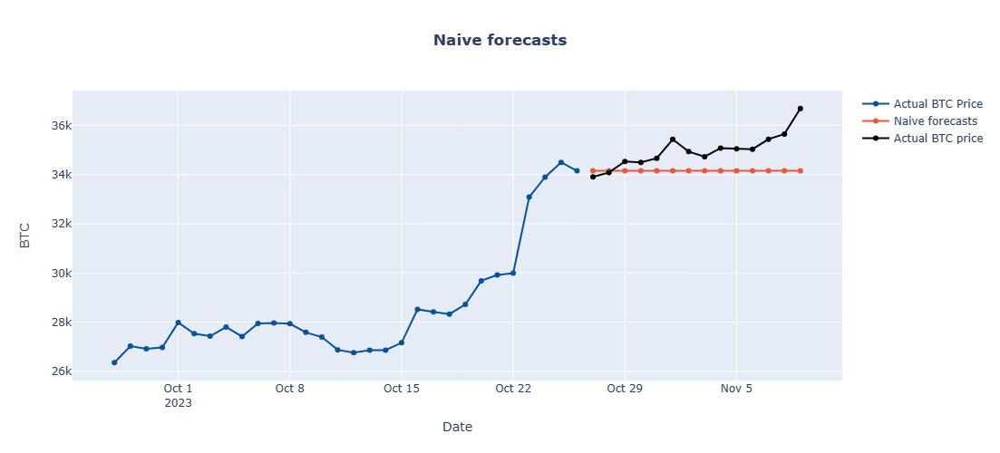

In [15]:
# Plot Naive forecasts
naive_forecasts = [y_test[-1] for _ in np.arange(14)]
plot_point_forecasts(test_data[['Price']].iloc[-30:],NEXT_DATES,
                     forecasts = [naive_forecasts,y_val],
                     forecaster_names = ["Naive forecasts","Actual BTC price"],
                     title="Naive forecasts",height=500)

We can see that the Naive model is not suitable for our series, which has a high variability.
It works best for stable datasets.

In the following sections we will use different techniques to improve our forecasts.

# Simple Moving average (SMA)

To estimate the trend of our series, we can use the [Simple Moving average](https://towardsdatascience.com/the-comprehensive-guide-to-moving-averages-in-time-series-analysis-3fb2baa749a#:~:text=In%20a%20centered%20moving%20average,is%20used%20in%20the%20window.) algorithm, which takes the average of our time series over either a centered or a trailing window as follows:
1. **Centred window:**

$$\hat{y}_t = {1 \over (2K+1)} \displaystyle\sum\limits_{i=-K}^{K}  {y}_{t+i}    $$

There are no values for either the first or the last K timesteps, because we do not have K observations on either side.

2. **Trailing window:**
$$\hat{y}_t = {1 \over K} \displaystyle\sum\limits_{i=1}^{K}  {y}_{t-i}    $$

Note that the **Simple Moving Average** assigns equal weight ($1/K$) to all past observations.

In [16]:
def moving_average_forecast(data, window_size,ma_type="trailing"):
    '''
    Forecasts the mean of our time series over either a centered or a trailing window. 
    If window_size=1, then this is equivalent to naive forecast.   
    INPUTS:
        data: Pandas Series or numpy array
        window_size: the window size of the moving average
        ma_type (str): the moving average type, in ["trailing","centred"]
    Outputs:
        forecast: numpy array containg the moving average forecasts
    '''    
    forecast = []
    if ma_type=="trailing":
        forecast = data.rolling(window=window_size, center=False).mean().dropna()[:-1] # using rolling method
        # forecast = [data[t-window_size:t].mean() for t in range(window_size,len(data))]        
        
    else:  
        forecast = data.rolling(window=window_size, center=True).mean().dropna() # using rolling method
        # k = max(1,int(window_size/2)) # window_size = 2k+1 
        # forecast = [data[t-k: t+k+1].mean() for t in range(k,len(data)-k)]
    
    return np.array(forecast)

#### Moving average with trailing window

In [17]:
# Calculate 3-day and 15-day moving averages with trailing windows
MA_trailing_3 = moving_average_forecast(test_data['Price'],window_size = 3)
MA_trailing_15 = moving_average_forecast(test_data['Price'],window_size = 15)

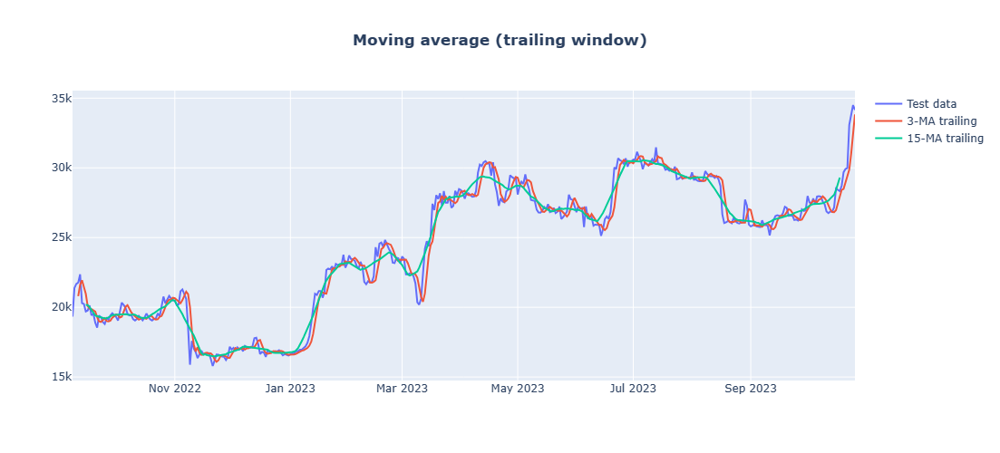

In [46]:
# Compare 3-day and 15-day moving averages (Trailing Windows)

fig = go.Figure()
num_timesteps = None # Number of timesteps to be displayed on the graph (set to None to display all timesteps)

fig.add_trace(go.Scatter(x=test_data['Price'][:num_timesteps].index, y=y_test[:num_timesteps], name='Test data'))
fig.add_trace(go.Scatter(x=test_data['Price'][3:num_timesteps].index, y=MA_trailing_3[:num_timesteps], name='3-MA trailing') )
fig.add_trace(go.Scatter(x=test_data['Price'][7:num_timesteps].index, y=MA_trailing_15[:num_timesteps], name='15-MA trailing') )
fig.update_layout(title_text=f"<b>Moving average (trailing window)</b>",title_x=0.5,height=500)

As can be seen from the graph, the larger the window size, the smoother the curve and the less sensitive the moving average is  to short-term randomness. 

In [19]:
# Let's evaluate 3-day and 15-day moving averages: 

metrics_MA_3_trailing = evaluate_model(y_test[3:],MA_trailing_3,"3-MA (trailing)",precision=2)
print("")
metrics_MA_15_trailing = evaluate_model(y_test[15:],MA_trailing_15,"15-MA (trailing)",precision=2)

3-MA (trailing) evaluation metrics:
RMSE: 741.42
MAE: 473.77
MAPE: 0.02
R2_score: 0.98

15-MA (trailing) evaluation metrics:
RMSE: 1447.72
MAE: 1000.67
MAPE: 0.04
R2_score: 0.91


The results of the 3-day moving average (3-MA) are worse than the Naive forecast.

In the next snippet, we will generate moving averages using varying trailing window sizes.

### Moving average forecast per trailing window size

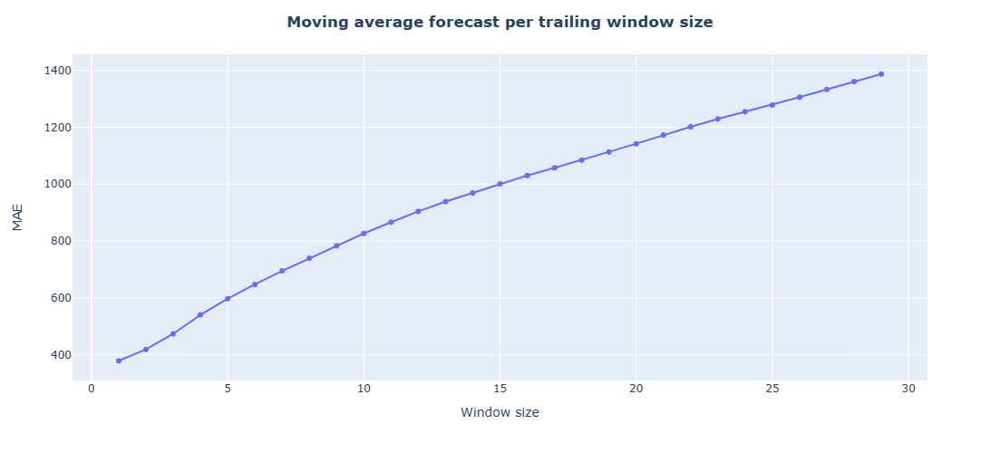

In [20]:
MAE = []
RMSE = []
for window_size in np.arange(1,30):
    ma_trailing = moving_average_forecast(test_data['Price'],window_size)
    metrics_ma_trailing = evaluate_model(y_test[window_size:],ma_trailing,"moving_avg_trailing",precision=2,show_results=False)
    MAE.append(metrics_ma_trailing['MAE'])
    RMSE.append(metrics_ma_trailing['RMSE'])


fig = px.line(x=np.arange(1,30), y=MAE, height=500,markers=True,  labels={"y": "MAE","x": "Window size"}       )
fig.update_layout(title_text="<b>Moving average forecast per trailing window size</b>", title_x=0.5)
fig.show();  

Using trailing windows, the Naive model (ie. window size =1) yields the best results of the Moving Average model.

#### Moving average with centred window

In [21]:
# window_size = 2k+1  
window_size = 3 
k = max(1,int(window_size/2))

moving_avg_centred = moving_average_forecast(test_data['Price'],window_size,ma_type="centred")

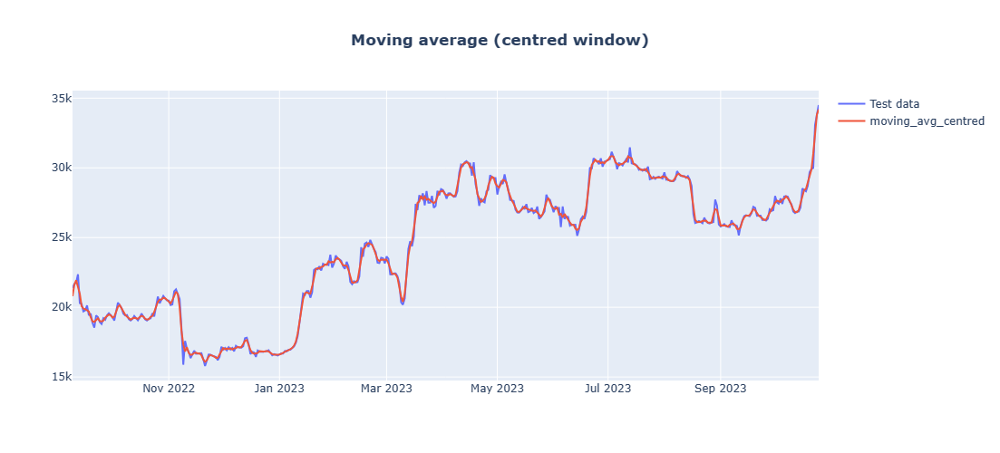

In [22]:
# Plot moving_avg_centred

fig = go.Figure()
fig.add_trace(go.Scatter(x=test_data['Price'][k:-k].index, y=y_test[k:-k], name='Test data'))
fig.add_trace(go.Scatter(x=test_data['Price'][k:-k].index, y=moving_avg_centred, name='moving_avg_centred') )
fig.update_layout(title_text=f"<b>Moving average (centred window)</b>",title_x=0.5,height=500)

In [23]:
metrics_MA_centred = evaluate_model(y_test[k:-k],moving_avg_centred,"moving_avg_centerd",precision=2)

moving_avg_centerd evaluation metrics:
RMSE: 271.17
MAE: 190.1
MAPE: 0.01
R2_score: 1.0


>Moving averages with a centred window are more accurate in estimating the trend of our series than moving averages with a trailing window.
>
>However, we can't use them to predict present values because we don't know the future values (the next **k** values, to be precise).

### Make forecasts with 3-MA (using a 3-day trailing window)

1-MA is equivalent to Naive model

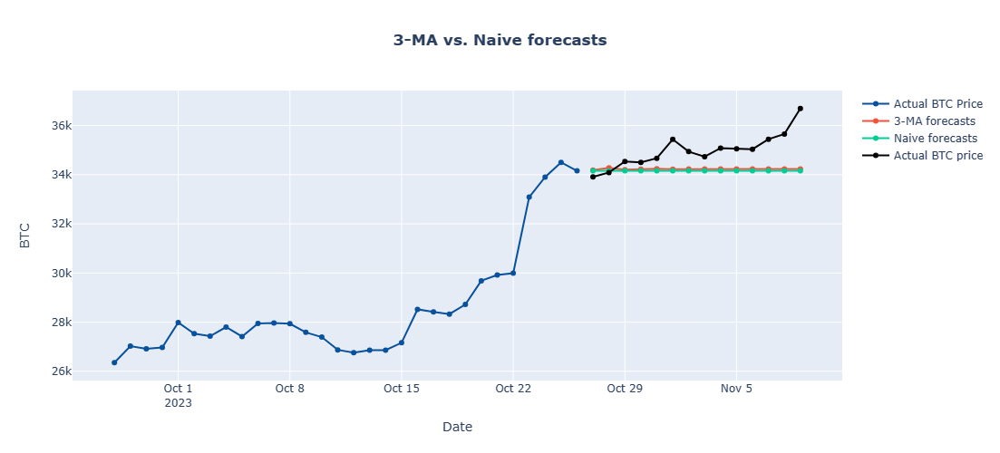

In [47]:
window_size = 3
num_forecasts = 14 # number of forecats
MA_2_forecasts = [] # list of forecast values

data = y_test[-window_size:]
for k in np.arange(num_forecasts):
    forecast = data.mean()
    MA_2_forecasts.append(data.mean())
    data = np.append(data[-(window_size-1):],[forecast])  

# plot 3-MA forecasts vs. Naive forecasts
plot_point_forecasts(test_data[['Price']].iloc[-30:],NEXT_DATES,
                     forecasts = [MA_2_forecasts,naive_forecasts,y_val],
                     forecaster_names = ["3-MA forecasts","Naive forecasts","Actual BTC price"],
                     title="3-MA vs. Naive forecasts",height=500)

We can see that the forecasts are almost flat. We need them to trend like our bitcoin price series.

To do this we will use Exponential Smoothing methods (SES and Holt's linear trend method).

# Exponontiel Smoothing (SES and Holt)

https://www.statsmodels.org/dev/examples/notebooks/generated/exponential_smoothing.html

In the previous section, we leveraged the simple Moving Average, which assigns equal weight to old and recent observations.

Exponential smoothing methods assign a different weight to each observation within the sliding window, with the weights decaying exponentially as the observations get older. 

1. The **Simple Exponential Smoothing** (SES) is suitable for our Bitcoin price series (a time series with no clear trend or seasonal pattern).
    $$ \hat{y}_{t} =  {\displaystyle\sum\limits_{i=0}^{T} (1-\alpha)^{i} y_{t-i}  } $$

    where **T** is the size of our time series and $0<=\alpha<=1$ is the smoothing factor.

2. The **Holt's linear trend method** model, applies exponential smoothing to both:
    - **level:** the weighted average of the obseravations plus the one-step forecast;
    - **trend:** the weighted average of the estimated trend (slope) of the series, where the `series = trend + seasonality + residuals`

    Mathematically, this can be written as follows:


    |     |  Holt method |
    | -------- | ------- 
    | h-step Forecast Equation  | $$ \hat{y}_{t+h|t}  = l_t + hb_t $$    |
    | Level Equation  | $$ l_t  = \alpha y_t + (1-\alpha)(l_{t-1}+b_{t-1}) $$    |
    | Trend Equation  | $$ b_t = \beta (l_t-l_{t-1}) + (1-\beta)b_{t-1}$$    |



    where $0<=\alpha<=1$ and $0<=\beta<=1$ are the smoothing level and the smoothing trend, respectively.

   The _h-step_ forecasts are a linear function of the horizon $h$ that will increase or decrease indefinitely into the future.
   
   To **dampen** the trend to a constant (ie. flat line) some time in the future, a damping parameter $\phi$ could be used as follows:

    |     |  Holt damped method |
    | -------- | ------- 
    | h-step Forecast Equation  | $$ \hat{y}_{t+h|t}  = l_t + \displaystyle\sum\limits_{i=1}^{h}  \phi^{i} b_t $$    |
    | Level Equation  | $$ l_t  = \alpha y_t + (1-\alpha)(l_{t-1}+ \phi b_{t-1}) $$    |
    | Trend Equation  | $$ b_t = \beta (l_t-l_{t-1}) + (1-\beta)\phi b_{t-1}$$    |

   The Holt's linear method is obtained when $\phi=1$. In practice, $0.8<=\phi<=0.98$.


### Evaluate Exponontiel Smoothing methods (SES and Holt)

We will compare SES and Holt’s `additive` and `damped` methods for various window sizes (last month, last 2 months, last year...).
- A one-step prediction is performed.
- For each prediction, we add y_test[k], the new observation, to the list of previous values. We then retrain the model.
  
Note that all of the models parameters (including the smoothing level and smoothing trend) will be optimized by statsmodels (by minimising the _SSE_ or the sum of the squared errors).

  

In [25]:
# Create a function to make one-step-forward predictions with SES and Holt methods

from statsmodels.tsa.holtwinters import Holt,SimpleExpSmoothing

def ExpSmoothing_preds(start_index,model="Holt",damped_trend=True,horizon=1,SPLIT_TIME=SPLIT_TIME):
    '''
    Make one-step predictions (len(test_data) predictions) using exponontial smoothing methos (SES and Holt).
    Use the last `N` points in the training dataset to make the one-step prediction.
    
    Parameters:
        - model (str): ExpSmoothing model, in ["Holt","SES"]
        - damped_trend(boolean): wheter damped or not
        - horizon (int): number of steps to be forecasted, default = 1, ie. one-step forecast.
        - SPLIT_TIME(int): the index of the staring timestep in the test dataset  
        - start_index (int): the initial time step index of the previuos values
                             ie. `bitcoin_prices.Price[start_index:SPLIT_TIME]` series will be used                                        
    '''
    preds = []
    
    start_time = time.time()
    
    with warnings.catch_warnings():
        warnings.filterwarnings("ignore")
    
        for k in np.arange(len(y_test)):
            # 1. Update the previous data points.
            data_k = bitcoin_prices.Price[start_index:SPLIT_TIME+k]
            
            # 2. Fit the data to the model
            if model=="Holt":
                model_fit = Holt(data_k, damped_trend=damped_trend, initialization_method="estimated").fit()
            else:
                model_fit = SimpleExpSmoothing(data_k, initialization_method="estimated").fit()
                
            # 3. Make h-step predicions where `h` is the horizon, default=1
            preds.append(model_fit.forecast(horizon).values[0])
        
        end_time = time.time()
        exec_time = int(end_time-start_time)
        if damped_trend is True:
            print(f"{model} damped, Window size: {SPLIT_TIME-start_index} days. Run time:",exec_time,"seconds")
        else:
            print(f"{model}, Window size: {SPLIT_TIME-start_index} days. Run time:",exec_time,"seconds")

        metrics = evaluate_model(y_test,preds,f"({model}_{SPLIT_TIME-start_index} timesteps)",precision=2,show_results=False)

        return preds,metrics,exec_time

In [26]:
# Make preds for various window sizes 

start_indexes = [SPLIT_TIME-30,SPLIT_TIME-60,SPLIT_TIME-90,SPLIT_TIME-120] + [SPLIT_TIME-(356*i) for i in range(1,int(SPLIT_TIME/356)+1)]
# start_indexes = [SPLIT_TIME-30,SPLIT_TIME-60]

list_preds_SES,list_metrics_SES,list_execTime_SES = ([],[],[])
list_preds_Holt,list_metrics_HOLT,list_execTime_HOLT = ([],[],[])
list_preds_Holt_damp,list_metrics_Holt_damp,list_execTime_Holt_damp = ([],[],[])

start_time = time.time()

for k in start_indexes:
    # SES
    preds_SES_k,metrics_SES_k,exec_time_SES_k = ExpSmoothing_preds(k,model="SES",damped_trend=False)
    list_preds_SES.append(preds_SES_k)
    list_metrics_SES.append(metrics_SES_k)
    list_execTime_SES.append(exec_time_SES_k) 

    # Holt
    preds_Holt_k,metrics_HOLT_k,exec_time_Holt_k = ExpSmoothing_preds(k,model="Holt",damped_trend=False)
    list_preds_Holt.append(preds_Holt_k)
    list_metrics_HOLT.append(metrics_HOLT_k)
    list_execTime_HOLT.append(exec_time_Holt_k)  

    # Holt additive damped
    preds_Holt_damp_k,metrics_HOLT_damp_k,exec_time_damp_k = ExpSmoothing_preds(k,model="Holt",damped_trend=True)
    list_preds_Holt_damp.append(preds_Holt_damp_k)
    list_metrics_Holt_damp.append(metrics_HOLT_damp_k)
    list_execTime_Holt_damp.append(exec_time_damp_k) 

end_time = time.time()
print("\n\n Run time:",round((end_time-start_time)/60,1),"minutes")

SES, Window size: 30 days. Run time: 2 seconds
Holt, Window size: 30 days. Run time: 10 seconds
Holt damped, Window size: 30 days. Run time: 11 seconds
SES, Window size: 60 days. Run time: 2 seconds
Holt, Window size: 60 days. Run time: 11 seconds
Holt damped, Window size: 60 days. Run time: 11 seconds
SES, Window size: 90 days. Run time: 2 seconds
Holt, Window size: 90 days. Run time: 15 seconds
Holt damped, Window size: 90 days. Run time: 14 seconds
SES, Window size: 120 days. Run time: 4 seconds
Holt, Window size: 120 days. Run time: 13 seconds
Holt damped, Window size: 120 days. Run time: 12 seconds
SES, Window size: 356 days. Run time: 2 seconds
Holt, Window size: 356 days. Run time: 15 seconds
Holt damped, Window size: 356 days. Run time: 15 seconds
SES, Window size: 712 days. Run time: 3 seconds
Holt, Window size: 712 days. Run time: 20 seconds
Holt damped, Window size: 712 days. Run time: 21 seconds
SES, Window size: 1068 days. Run time: 4 seconds
Holt, Window size: 1068 days. 

In [48]:
def create_ExpSmoothing_DF(model_name,start_indexes,list_metrics,list_exec_time,SPLIT_TIME=SPLIT_TIME):
    '''Convert ExpSmoothing results to pandas DataFrames'''
    
    dict_metrics = {SPLIT_TIME-start_indexes[0]:list_metrics[0]}
    dict_exec_time = {SPLIT_TIME-start_indexes[0]:list_exec_time[0]}
    
    for k in np.arange(1,len(list_metrics)):
        dict_metrics.update({SPLIT_TIME-start_indexes[k]:list_metrics[k]})
        dict_exec_time.update({SPLIT_TIME-start_indexes[k]:list_exec_time[k]})
        
    metrics_df = pd.DataFrame(dict_metrics).T.reset_index().rename(columns={"index":"window_size"})
    metrics_df["model_name"] = model_name
    
    exec_time_df = pd.DataFrame(list_exec_time,
                                     index=[SPLIT_TIME-start_index  for start_index in start_indexes],
                                     columns=["exec_time"]).reset_index().rename(columns={"index":"window_size"})
    exec_time_df["model_name"] = model_name

    return metrics_df,exec_time_df    


metrics_SES_df,exec_time_SES_df = create_ExpSmoothing_DF("SES",start_indexes,list_metrics_SES,list_execTime_SES)
metrics_HOLT_df,exec_time_HOLT_df = create_ExpSmoothing_DF("Holt",start_indexes,list_metrics_HOLT,list_execTime_HOLT)
metrics_HOLT_damp_df,exec_time_HOLT_damp_df = create_ExpSmoothing_DF("Holt_damped",start_indexes,list_metrics_Holt_damp,list_execTime_Holt_damp)

# 2. Concat dataframes
metrics_ExpSmoothing_DF = pd.concat([metrics_SES_df,metrics_HOLT_df,metrics_HOLT_damp_df])
exec_time_ExpSmoothing_DF = pd.concat([exec_time_SES_df,exec_time_HOLT_df,exec_time_HOLT_damp_df])

# 3. Save resutlts to csv files
metrics_ExpSmoothing_DF.to_csv("./stats/ExpSmoothing_metrics_WindowSize.csv",index=False)
exec_time_ExpSmoothing_DF.to_csv("./stats/ExpSmoothing_execTime_WindowSize.csv",index=False)

In [49]:
# 4. read CSV files
metrics_ExpSmoothing_DF = pd.read_csv("./stats/ExpSmoothing_metrics_WindowSize.csv")
exec_time_ExpSmoothing_DF = pd.read_csv("./stats/ExpSmoothing_execTime_WindowSize.csv")
metrics_ExpSmoothing_DF.head()

,window_size,model_name,RMSE,MAE,MAPE,r2_score
0,30,SES,590.30,379.96,0.02,0.98
1,60,SES,587.01,377.68,0.02,0.98
2,90,SES,585.81,377.90,0.02,0.98
3,120,SES,586.13,378.03,0.02,0.98
4,356,SES,585.77,377.90,0.02,0.98


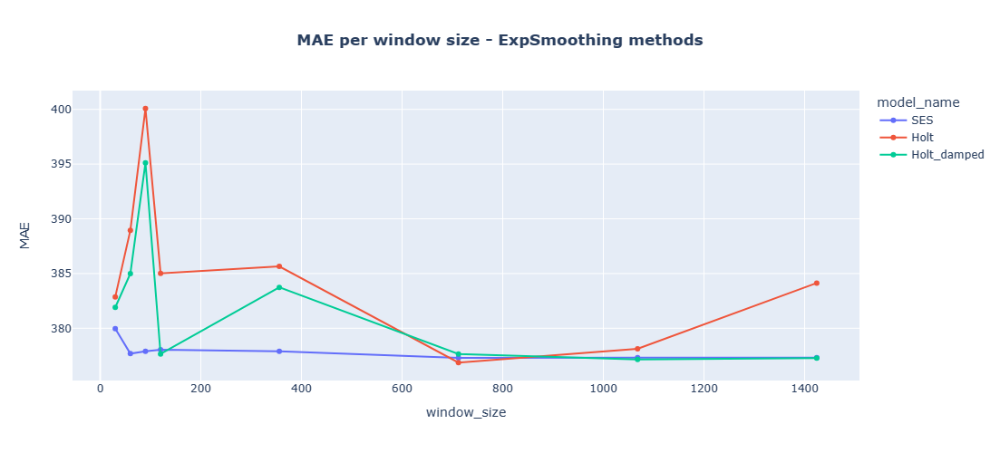

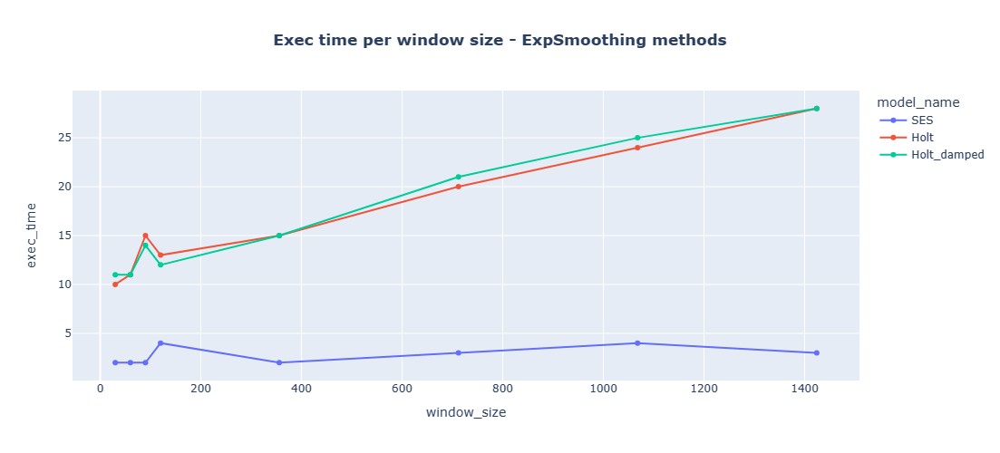

In [50]:
# MAE
fig = px.line(metrics_ExpSmoothing_DF, x="window_size", y="MAE", color='model_name',height=500,title="MAE",markers=True)
fig.update_layout(title_text="<b>MAE per window size - ExpSmoothing methods</b>", title_x=0.5)
fig.show();

# Exec time (seconds)
fig = px.line(exec_time_ExpSmoothing_DF, x="window_size", y="exec_time", color='model_name',height=500,title="Exec time (seconds)",markers=True)
fig.update_layout(title_text="<b>Exec time per window size - ExpSmoothing methods</b>", title_x=0.5)
fig.show();

With a window size greater than two years, the SES and Holt damped methods slightly outperformed the naive model, with an MAE of 377.

Comparable MAEs to the damped Holt are obtained with the SES, with faster execution time, which make them our best choice right now.

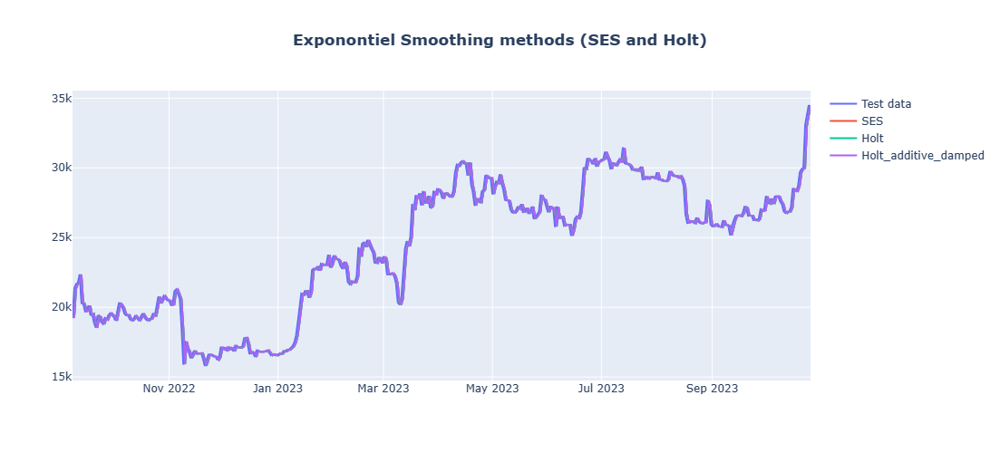

In [51]:
# Plot Exponontiel Smoothing predictions (SES and Holt) 
# window size = 2 years (the fifth elemnt in our list_preds)

fig = go.Figure()
fig.add_trace(go.Scatter(x=test_data['Price'].index, y=y_test, name='Test data'))
fig.add_trace(go.Scatter(x=test_data['Price'].index, y=list_preds_SES[5], name='SES') )
fig.add_trace(go.Scatter(x=test_data['Price'].index, y=list_preds_Holt[5], name='Holt') )
fig.add_trace(go.Scatter(x=test_data['Price'].index, y=list_preds_Holt_damp[5], name='Holt_additive_damped') )
fig.update_layout(title_text=f"<b>Exponontiel Smoothing methods (SES and Holt)</b>",title_x=0.5,height=500)

In [52]:
# Compare Naive, MA, SES and Holt's linear trend method

best_results_ExpSmoothing = metrics_ExpSmoothing_DF[metrics_ExpSmoothing_DF['window_size']==712].drop("window_size",axis=1)
best_results_ExpSmoothing = best_results_ExpSmoothing.set_index("model_name")

results = pd.DataFrame([metrics_naive,metrics_MA_3_trailing]).set_index("model_name")
results = pd.concat([results,best_results_ExpSmoothing])
results.sort_values(by="MAE",ascending=True)

,RMSE,MAE,MAPE,r2_score
model_name,,,,
Holt,586.87,376.86,0.02,0.98
SES,586.41,377.30,0.02,0.98
Holt_damped,586.87,377.65,0.02,0.98
Naive_Forecast,586.38,378.85,0.02,0.98
3-MA (trailing),741.42,473.77,0.02,0.98


A slight improvement is observed with the Holt damped and SES models (compared to the naive forecast).

### Make forecasts with SES and Holt damped methods 
We will make 14 days forecast. Window size = 2 years.

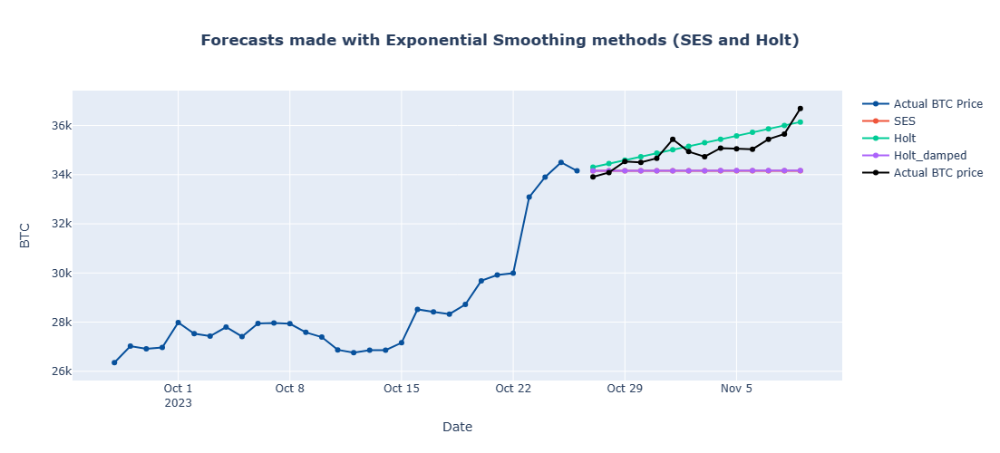

In [185]:
from statsmodels.tsa.holtwinters import Holt,SimpleExpSmoothing

previous_times = 356*2 # the window size 
next_times = len(NEXT_DATES) # 14 days

if previous_times == None:
    data = bitcoin_prices[['Price']][:-next_times] 
else:
    data = bitcoin_prices[['Price']][-(next_times+previous_times):-next_times] 

with warnings.catch_warnings():
    warnings.filterwarnings("ignore")
    fit1 = SimpleExpSmoothing(data, initialization_method="estimated").fit()
    fcast1 = fit1.forecast(next_times).rename("SES")
    fit2 = Holt(data, initialization_method="estimated").fit()
    fcast2 = fit2.forecast(next_times).rename("Holt")
    fit3 = Holt(data, damped_trend=True, initialization_method="estimated").fit( damping_trend=0.98)
    fcast3 = fit3.forecast(next_times).rename("Holt_damped")
    # fit4 = Holt(data, exponential=True, initialization_method="estimated").fit()
    # fcast4 = fit4.forecast(next_times).rename("Exponential")    
    # fit5 = Holt( data, exponential=True, damped_trend=True, initialization_method="estimated").fit()
    # fcast5 = fit5.forecast(next_times).rename("Holt_multiplicative_damped")

plot_point_forecasts(data[-30:],NEXT_DATES,
                     forecasts = [fcast1.values,fcast2.values,fcast3.values,y_val],
                     forecaster_names = [fcast1.name,fcast2.name,fcast3.name,'Actual BTC price'],
                     title="Forecasts made with Exponential Smoothing methods (SES and Holt)",height=500)

As we can see from the graph, the SES does not detect trends or seasonal patterns as the trend of the 14-step forecasts is flat.

With Halt's method, the forecasts are no longer flat but trending: they display a **constant** increasing trend into the future.

In [33]:
# Holt and SES params where a Window of 2 years is used:
holt_params_2years = pd.DataFrame.from_dict({fcast1.name:fit1.params,
                                             fcast2.name:fit2.params,
                                             fcast3.name:fit3.params
                                             })
holt_params_2years

,SES,Holt,Holt_damped
smoothing_level,0.997543,0.977316,0.995
smoothing_trend,NaN,0.022856,0.0001
smoothing_seasonal,NaN,NaN,NaN
damping_trend,NaN,NaN,0.98
initial_level,65459.489858,64094.311052,64021.799219
initial_trend,NaN,-442.49759,-787.568608
initial_seasons,[],[],[]
use_boxcox,False,False,False
lamda,None,None,None
remove_bias,False,False,False


The very small value of the smoothing trend ($\beta$) means that the slope hardly changes over time.

# ARIMA model with pmdarima

In this section, we will be using the [ARIMA](https://alkaline-ml.com/pmdarima/tips_and_tricks.html) model, which provides a different approach to time series forecasting.

While exponential smoothing algorithms aim to describe the trend and seasonality of the series, ARIMA models exploit the autocorrelations in the data.

Before we delve into ARIMA models using the [pmdarima](http://alkaline-ml.com/pmdarima/) package, let's take a look at the autocorrelation function (ACF).

In [34]:
# !pip install pmdarima
import pmdarima as pm

## ACF

https://www.geeksforgeeks.org/how-to-calculate-autocorrelation-in-python/

Autocorrelation measures the linear relationship between lagged values of a time series. The relationship between  $y_{t}$ and $y_{t-k}$ can be written as:
$$ r_k = {\displaystyle\sum\limits_{t=k+1}^{T}  (y_t-\bar y) (y_{t-k}-\bar y)   \over   \displaystyle\sum\limits_{t=1}^{T} (y_t-\bar y)^2} $$

where T is is the length of the time series and $\bar y$ is its mean. The autocorrelation function or ACF is made up of the autocorrelation coefficients. \
It can be calculated using the `ACF()` function from `statsmodels.tsa.stattools`. \
\
To display the autocorrelation coefficients, we can use the `plot_acf` function from `statsmodels.graphics.tsaplots` or `autocorrelation_plot` from `pandas.plotting`. But for better visibility, we will create our own plot_acf function using Plotly.


For white noise series, we expect each autocorrelation to be close to zero and 95% of the spikes in the ACF to lie within  **± 1.96/$\sqrt{T}$**.

If one or more large spikes are outside these bounds, then the series is probably not white noise.


In [54]:
import statsmodels.api as sm
ACF_values = sm.tsa.stattools.acf(bitcoin_prices['Price'],nlags=len(bitcoin_prices))

# Confidence Intervals (95%) - Null Hypothesis is white noise
CI = round(1.96/np.sqrt(len(bitcoin_prices)),4)

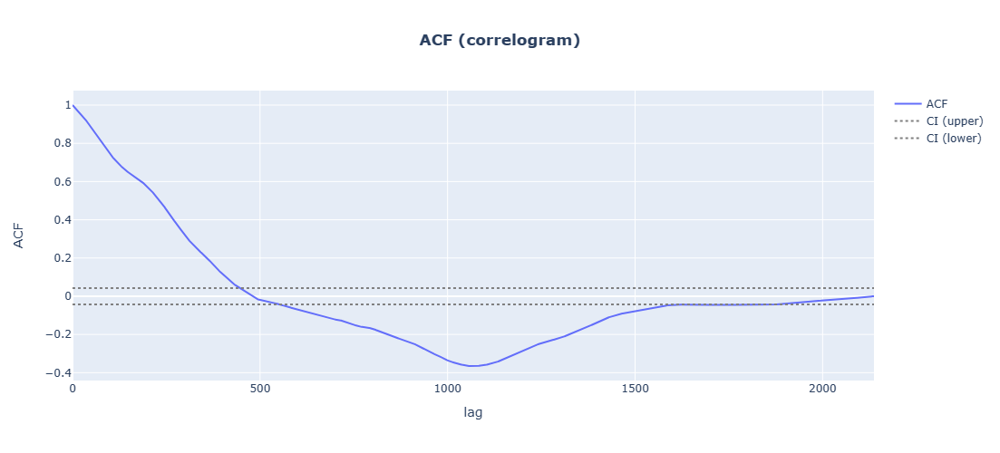

In [55]:
#########################################################################################
# 1.      Use pandas.plotting and statsmodels.graphics.tsaplots to plot ACF and PACF
#########################################################################################

# from pandas.plotting import autocorrelation_plot
# # autocorrelation_plot(bitcoin_prices['Price']).set_xlim([0, 30])
# autocorrelation_plot(bitcoin_prices['Price'])

# from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
# plot_acf(bitcoin_prices["Price"],lags=50, alpha=.05)
# plot_pacf(bitcoin_prices['Price'])

#########################################################################################
# 2.          Create function to plot xACF and Confidence intervals vs. lags
#########################################################################################

def plot_xACF_plotly(xACF_values,CI,height=500,title="ACF (correlogram)",xaxis_title="lag",yaxis_title="ACF"):
    '''Plot ACF and PACF using Plotly'''
    fig = go.Figure()
    
    # Plot xACF
    fig.add_trace(go.Scatter(x=np.arange(len(xACF_values)), y=xACF_values,
                        mode='lines',
                        name='ACF'))
    
    # Plot confidence intervals
    fig.add_trace(go.Scatter(x=np.arange(len(xACF_values)), y=[+CI for _ in np.arange(len(xACF_values))],
                        name='CI (upper)',line=dict(color='gray', width=2, dash='dot')))
    fig.add_trace(go.Scatter(x=np.arange(len(xACF_values)), y=[-CI for _ in np.arange(len(xACF_values))],
                        name='CI (lower)',line=dict(color='gray', width=2, dash='dot')))
    
    # Update layout
    fig.update_layout(title_text=f"<b>{title}</b>",title_x=0.5,
                      xaxis_title='lag',
                      yaxis_title=yaxis_title,
                     height=height)
    fig.show()


plot_xACF_plotly(ACF_values,CI)

The ACF plot shows a strong autocorrelation between the current price and the closest previous observations, and a slow linear decrease from there.

## ARIMA

ARIMA is an acronym for AutoRegressive Integrated Moving Average. _Integrated_ is the differencing we saw in the previous section. 

The ARIMA(p,d,q) model includes both lagged values of $y_t$ (AR part) and lagged errors $\epsilon_{t}$ (MA part) and can be written as follows:

$$\acute{y}_t = c + \displaystyle\sum\limits_{i=1}^{p}  \phi_{i} \acute{y}_{t-i}  + \displaystyle\sum\limits_{j=1}^{q} \theta_{j} \epsilon_{t-j}  +  \epsilon_{t}$$

where:
- **$\acute{y}_t$** is the differenced series (d-order difference, d>=1);
- **p** = The order of the autoregressive (AR);
- **d** = The degree of the differencing used to obtain a stationary series;
- **q** = The order of the moving average (MA) model.

The parameters **p** and **q** can be searched iteratively with the `auto_arima` function.

Tests of stationarity (like _ADF_ or _KPSS_) are required to estimate the differencing term, **d**.

### Differencing (d)

To address the non-stationarity of our series, we will take a first difference of the data.

In [56]:
# first order differencing 
y_diff1 = bitcoin_prices['Price'].diff(1)[1:]

# y_diff1 = pm.utils.diff(bitcoin_prices['Price'], lag=1) # with pmdarima

# y_diff1 = sm.tsa.statespace.tools.diff(bitcoin_prices['Price'], k_diff=1, k_seasonal_diff=None, seasonal_periods=None) #with statsmodel

Auto-correlation plots are an easy way to determine whether our time series is sufficiently stationary for modeling. 

Let's check the ACF of the differences series.

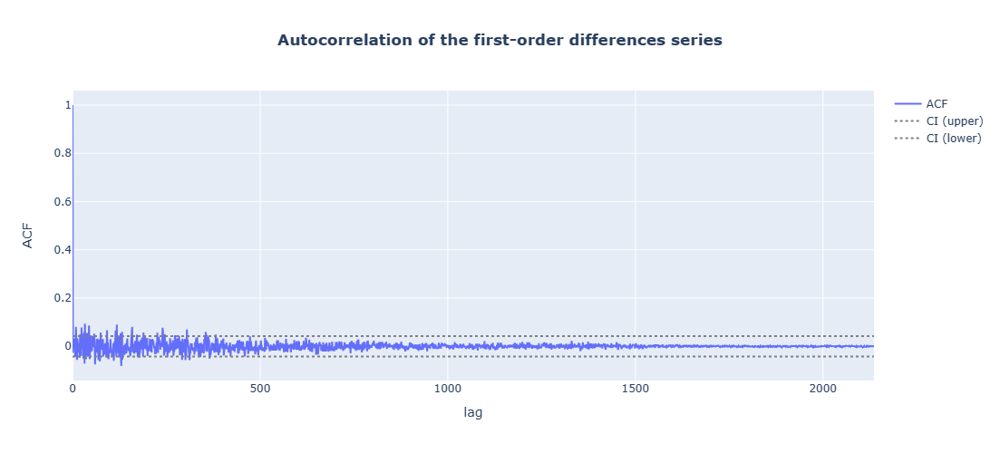

In [57]:
# compute and plot ACF of the differences series
ACF_values_diff1 = sm.tsa.stattools.acf(y_diff1,nlags=len(y_diff1))

plot_xACF_plotly(ACF_values_diff1,CI,title="Autocorrelation of the first-order differences series" )

The autocorrelation plot of the _differences series_ appears relatively stationary. It shows no significant relationship between the lagged observations (all correlations are small and close to zero). Thus, the parameter **d** is likely to be 1. 

### Tests of stationarity

To determine more quantitatively whether we need to difference our data to make it stationary, and to estimate the number of differences, we can run a test of stationarity (either ADFTest, PPTest or KPSSTest).

In [39]:
# 1. Test whether we should difference at the alpha=0.05 significance level

from pmdarima.arima.stationarity import ADFTest

adf_test = ADFTest(alpha=0.05)
p_val, should_diff = adf_test.should_diff(y_train)  # (0.01, False)

p_val, should_diff

(0.6887339032106057, True)

In [40]:
# 2. Estimate the number of differences using an ADF test:

from pmdarima.arima.utils import ndiffs

# ADF test
n_adf = ndiffs(y_train, test='adf')  

# or a KPSS test (auto_arima default):
n_kpss = ndiffs(y_train, test='kpss')  

# Or a PP test:
n_pp = ndiffs(bitcoin_prices.Price, test='pp')  

print("n_adf:",n_adf)
print("n_kpss:",n_kpss)
print("n_pp:",n_pp)

n_adf: 1
n_kpss: 1
n_pp: 1


In [41]:
# 3. Estimate number of seasonal differences using a Canova-Hansen test

from pmdarima.arima.utils import nsdiffs

n_ch = nsdiffs(y_train,
            m=7,  # commonly requires knowledge of dataset
            max_D=12,
            test='ch')  

# or use the OCSB test (by default)
n_ocsb = nsdiffs(y_train,
        m=7,
        max_D=12,
        test='ocsb')  


print("n_ch:",n_ch)
print("n_ocsb:",n_ocsb)

n_ch: 0
n_ocsb: 0


### Use ACF and PACF plots to determine appropriate values for  p and q

ACF and PACF can soetimes helps to guess the paremeters (p and q) of the ARIMA model.

Partial autocorrelations measure the relationship between $y_{t}$ and $y_{t-k}$ after removing the effects of lags 1,2,3,..k.

They have the same critical values of **± 1.96/$\sqrt{T}$** as for ordinary autocorrelations

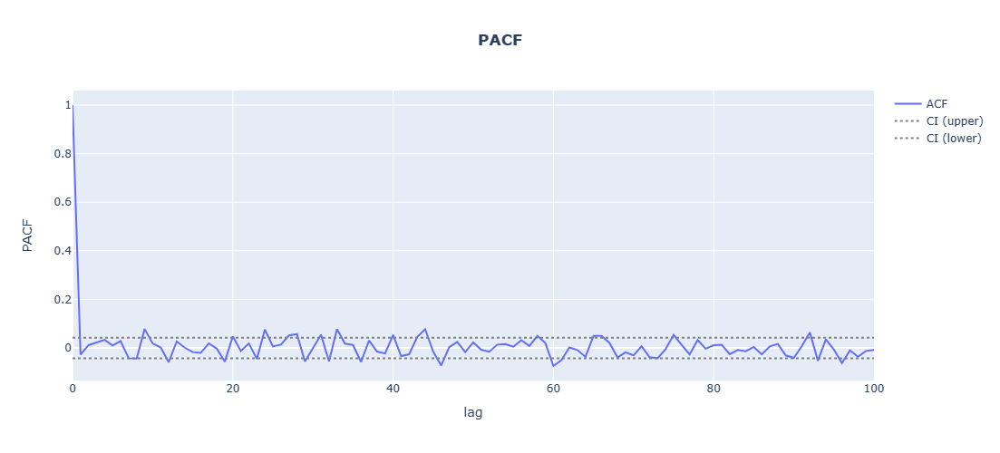

In [42]:
PACF_values_diff1 = sm.tsa.stattools.pacf(y_diff1,nlags=100)

plot_xACF_plotly(PACF_values_diff1,CI,height=500,title="PACF",yaxis_title="PACF")

Since there is no significant spike at lag **p** in the ACF and PACF plots of the differenced data, it is not possible to detremine (simply from these plots) whether the data are from an ARIMA(p,d,0) or an ARIMA(0,d,q).

In the next section, we will use the `auto_arima` process from `pmdarima` to automatically identify the most optimal parameters for an ARIMA(p,d,q) model.

### Auto_arima

In [62]:
# import necessary libraries
from statsmodels.tsa.arima_model import ARIMA

# use pmdarima to automatically select best ARIMA model
ARIMA_model = pm.auto_arima(y_train, 
                      m=0,               # frequency of series                      
                      seasonal=False,  # TRUE if seasonal series
                      d=1,             # set d=None to let model determine 'd'
                      test='adf',         # use adftest to find optimal 'd'
                      start_p=0, start_q=0, # minimum p and q
                      max_p=12, max_q=12, # maximum p and q
                      D=None,             # let model determine 'D'
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=False)

# print model summary and order
print(ARIMA_model.summary())
print("model order = ",ARIMA_model.order)

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=28569.677, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=28570.162, Time=0.07 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=28571.956, Time=0.12 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=28572.461, Time=0.19 sec
 ARIMA(0,1,4)(0,0,0)[0] intercept   : AIC=28571.605, Time=0.17 sec
 ARIMA(0,1,5)(0,0,0)[0] intercept   : AIC=28573.607, Time=0.22 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=28570.129, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=28572.093, Time=0.11 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=28572.020, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=28572.761, Time=0.59 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=28573.627, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=28572.002, Time=0.10 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=28572.161, Time=0.65 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=28559.980, Time=2.23 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=28561.977, Time=2.56

The auto_arima function performed a full (or a stepwise) search through various combinations of the p, d, and q parameters of ARIMA and selects the parameters that minimize the AIC value (_Akaike’s Information Criterion_).

The summary displays the AIC values and estimated model parameters for each candidate model that was evaluated. 

- The automated stepwise selection has identified an **ARIMA(0,1,0)** model, which is equivalent to a random walk..
- The full search (stepwise=False) has found that an **ARIMA(2,1,2)** gives the lowest AIC value.

## Residual diagnostics
https://otexts.com/fpp3/diagnostics.html

It is important to check that the residuals are uncorrelated, so that there is no information left in them, and that they have a mean of zero, so that the forecasts are not biased.

In [63]:
ARIMA_residuals = ARIMA_model.resid()

In [171]:
def residual_diagnostics(res,model_name=""):
    '''residual diagnostics include:
    1. Plot the residuals;
    2. Plot Histogram of residulas (check tha the residuals are normally distributed);
    3. Plot the ACF of the rsiduals (Check that the residuals are within the CI).
    '''
    # 1. Plot the residuals
    fig = px.line(x=np.arange(len(res)), y=res,height=400)

    fig.update_layout(title_text=f"<b>Residulas from {model_name} model</b>", title_x=0.5,
                      xaxis_title='',
                      yaxis_title='')
    fig.show()

    # 2. Plot Histogram of residulas

    fig = go.Figure(data=[go.Histogram(x=res)],
                layout={'title': f"<b>Histogram of the residulas from {model_name} model</b>", 
                        'title_x':0.5,
                        'yaxis': {'title': 'Count'},
                        'xaxis': {'title': '.resid'},
                       }
               )
    fig.show()

    #3. Plot the ACF of the residuals
    ACF_residuals = sm.tsa.stattools.acf(res,nlags=len(res))
    
    # Confidence interval (95%) - Null Hypothesis is white noise
    CI = round(1.96/np.sqrt(len(y_train)),4)
    plot_xACF_plotly(ACF_residuals,CI,height=400,title=f"ACF of the residuals from {model_name} model",yaxis_title="ACF")

    # 4. Check if the residuls have zero mean
    mean_res = round(res.mean(),4)
    print("Mean of the residuals = ",mean_res)
    if np.abs(mean_res)>0.05:
        print(f"As the mean is not zero, then the forecasts are biased. To handle this, we can add {mean_res} \
to all forecasts and the bias problem is solved.")


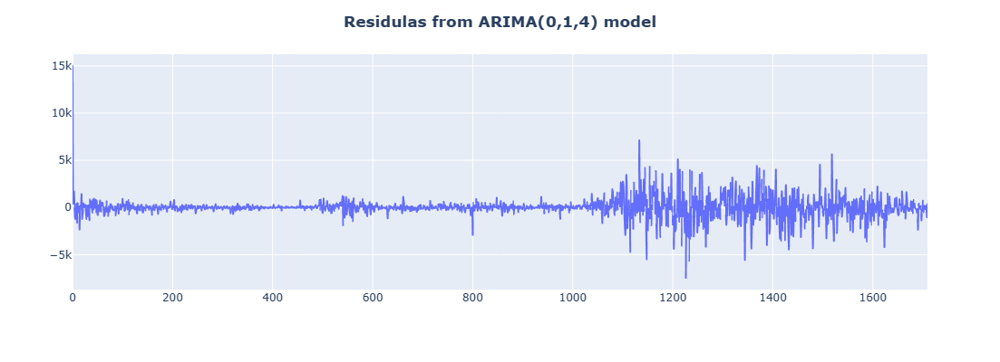

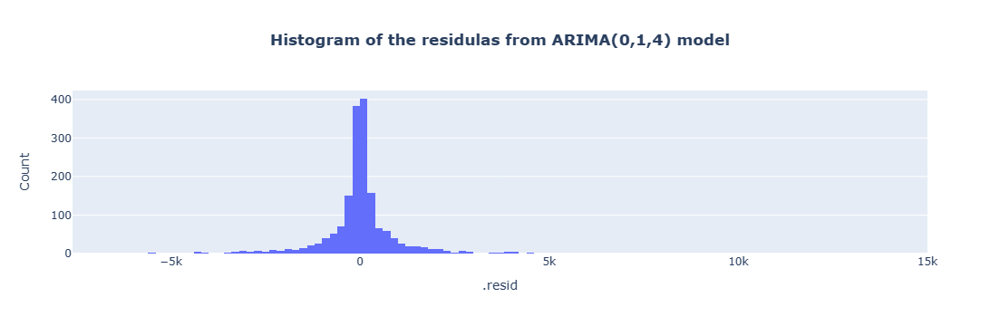

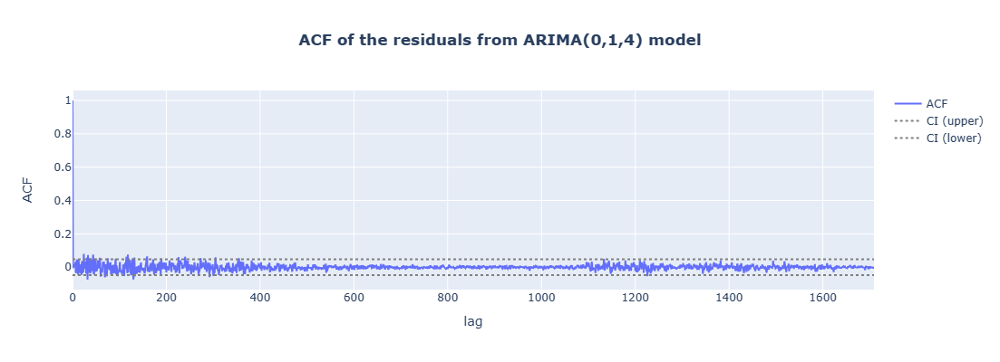

Mean of the residuals =  9.2123
As the mean is not zero, then the forecasts are biased. To handle this, we can add 9.2123 to all forecasts and the bias problem is solved.


In [172]:
residual_diagnostics(ARIMA_residuals,model_name="ARIMA(0,1,4)")

The ACF plot of the residuals from the ARIMA(2,1,2) model shows that the residuals are uncorrelated, so there is no information left in the residuals that should be used to compute forecasts.

### Predictions

To make a one-step-ahead forecast, and as explained [here](https://alkaline-ml.com/pmdarima/refreshing.html), we can update our ARIMA model only with new observations (in our case, prices from the y_test dataset), so that future forecasts take into account the latest observations. 


In [66]:
def forecast_one_step(model):
    '''
    Make one-step forecast using ARIMA.
    Inputs:
        -model: the ARIMA model
    Outputs:
        - fc: the point predictions
        - CI_95 and CI_80: Confidence intervals with alpha=0.05 and 0.2.
    '''
    fc, CI_95 = model.predict(n_periods=1, return_conf_int=True,alpha=0.05)
    _ , CI_80 = model.predict(n_periods=1, return_conf_int=True,alpha=0.2)
    return (
        fc.tolist()[0],
        np.asarray(CI_95).tolist()[0],
        np.asarray(CI_80).tolist()[0])

In [67]:
ARIMA_preds = []
ARIMA_CI_95 = []
ARIMA_CI_80 = []

start_time = time.time()
for i,y_test_i in enumerate(y_test):
    if ((i%10)==0)&(i>0):
        print(f"{i} predictions made...")
    fc, CI_95,CI_80 = forecast_one_step(ARIMA_model)
    ARIMA_preds.append(fc)
    ARIMA_CI_95.append(CI_95)
    ARIMA_CI_80.append(CI_80)

    # Update our ARIMA model with new observation (ie. y_test[i])
    ARIMA_model.update(y_test_i)

end_time = time.time()
print("\nRun time:",round((end_time-start_time)/60,1),"minutes")

10 predictions made...
20 predictions made...
30 predictions made...
40 predictions made...
50 predictions made...
60 predictions made...
70 predictions made...
80 predictions made...
90 predictions made...
100 predictions made...
110 predictions made...
120 predictions made...
130 predictions made...
140 predictions made...
150 predictions made...
160 predictions made...
170 predictions made...
180 predictions made...
190 predictions made...
200 predictions made...
210 predictions made...
220 predictions made...
230 predictions made...
240 predictions made...
250 predictions made...
260 predictions made...
270 predictions made...
280 predictions made...
290 predictions made...
300 predictions made...
310 predictions made...
320 predictions made...
330 predictions made...
340 predictions made...
350 predictions made...
360 predictions made...
370 predictions made...
380 predictions made...
390 predictions made...
400 predictions made...
410 predictions made...

Run time: 1.5 minutes


In [68]:
# Evaluate ARIMA model:
metrics_ARIMA = evaluate_model(y_test, ARIMA_preds,f"ARIMA{ARIMA_model.order}")

ARIMA(2, 1, 2) evaluation metrics:
RMSE: 597.4679
MAE: 391.4704
MAPE: 0.0163
R2_score: 0.9837


In [69]:
print(f"- The average price of Bitcoin in the test dataset is: ${int(y_test.mean())}")
print(f"- Each prediction in the ARIMA{ARIMA_model.order} forecast is off by an average of ${metrics_ARIMA['MAE']}, \
which is {round(metrics_ARIMA['MAE']/y_test.mean()*100,1)}% of the mean.")

- The average price of Bitcoin in the test dataset is: $24309
- Each prediction in the ARIMA(2, 1, 2) forecast is off by an average of $391.4704, which is 1.6% of the mean.


In [70]:
# Compare all models (Naive, MA, SES, Holt and ARIMA)

results = pd.DataFrame([metrics_ARIMA,metrics_naive,metrics_MA_3_trailing]).set_index("model_name")
results = pd.concat([results,best_results_ExpSmoothing])
results.sort_values(by="MAE",ascending=True)


,RMSE,MAE,MAPE,r2_score
model_name,,,,
Holt,586.8700,376.8600,0.0200,0.9800
SES,586.4100,377.3000,0.0200,0.9800
Holt_damped,586.8700,377.6500,0.0200,0.9800
Naive_Forecast,586.3800,378.8500,0.0200,0.9800
"ARIMA(2, 1, 2)",597.4679,391.4704,0.0163,0.9837
3-MA (trailing),741.4200,473.7700,0.0200,0.9800


Exponential smoothing methods (SES and damped Holt) still give the best results.

Note that the Naive forecasts are better than those of ARIMA(0,1,4).

### Viewing predictions
Let's take a look at the predictions our model has made and their confidence intervals.

In [71]:
def plot_predictions(test_data,y_test,preds,CI_95_lower,CI_95_upper,CI_80_lower,CI_80_upper,title,height=500):
    '''plot point predictions and Confidence intervals with Plotly.'''
    fig = go.Figure()

    # colors:
    orange = cl.flipper()['seq']['9']['Oranges']
    blue = cl.flipper()['seq']['9']['Blues']
    
    # 1. Confidence intervals
    if CI_95_lower is not None:        
        
        fig.add_trace(go.Scatter(x=test_data.index, y=CI_95_lower,
                                 name='CI 95% (lower)',fill=None,
                                 line_color=orange[2])
                     )
        fig.add_trace(go.Scatter(x=test_data.index, y=CI_95_upper,
                                 name='CI 95% (upper)',fill='tonexty',
                                 line_color=orange[2],
                                 fillcolor=orange[2]))
    
    if CI_80_lower is not None:
        
    
        fig.add_trace(go.Scatter(x=test_data.index, y=CI_80_lower,
                                 name='CI 80% (lower)',fill=None,
                                 line_color=orange[4])
                     )
        fig.add_trace(go.Scatter(x=test_data.index, y=CI_80_upper,
                                 name='CI 80% (upper)',fill='tonexty',
                                 line_color=orange[4],
                                 fillcolor=orange[4]))
    
    # 2. Plot predictions and actual prices    
    fig.add_trace(go.Scatter(x=test_data.index, y=preds, mode='lines', name='Predicted prices',
                             line=dict(color=blue[7], width=3, dash='dot')
                            ))
    fig.add_trace(go.Scatter(x=test_data.index, y=y_test, mode='lines', name='Actual prices',
                             line=dict(color='black', width=2)
                            ))
    
    
    fig.update_layout(title_text=f"<b>{title}</b>",title_x=0.5,
                      xaxis_title='Date',
                      yaxis_title="BTC",
                      height=height)
    fig.show()

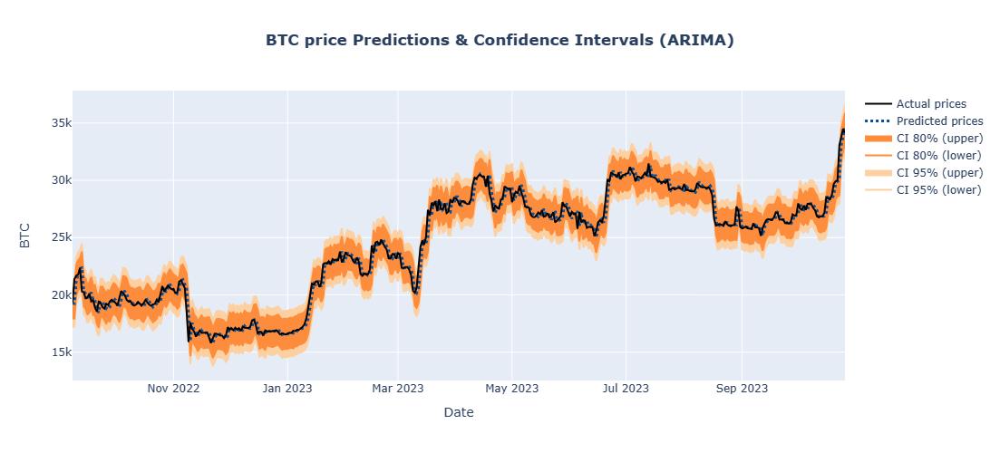

In [72]:
ARIMA_CI_95_lower = np.asarray(ARIMA_CI_95)[:, 0]
ARIMA_CI_95_upper = np.asarray(ARIMA_CI_95)[:, 1]
ARIMA_CI_80_lower = np.asarray(ARIMA_CI_80)[:, 0]
ARIMA_CI_80_upper = np.asarray(ARIMA_CI_80)[:, 1]

plot_predictions(test_data,y_test,ARIMA_preds,ARIMA_CI_95_lower,ARIMA_CI_95_upper,ARIMA_CI_80_lower,ARIMA_CI_80_upper,
                 title="BTC price Predictions & Confidence Intervals (ARIMA)")

### Make a 14-step-ahead forecast with ARIMA

In [75]:
y_all = bitcoin_prices["Price"][:-14].to_numpy()

# use pmdarima to automatically select best ARIMA model
ARIMA_model = pm.auto_arima(y_all, 
                      m=0,               # frequency of series                      
                      seasonal=False,  # TRUE if seasonal series
                      d=None,             # set d=None to let model determine 'd'
                      test='adf',         # use adftest to find optimal 'd'
                      start_p=0, start_q=0, # minimum p and q
                      max_p=12, max_q=12, # maximum p and q
                      D=None,             # let model determine 'D'
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=False)

# print model summary and order
print(ARIMA_model.summary())
print("model order = ",ARIMA_model.order)

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=35188.655, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=35189.222, Time=0.07 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=35190.769, Time=0.16 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=35190.919, Time=0.27 sec
 ARIMA(0,1,4)(0,0,0)[0] intercept   : AIC=35190.113, Time=0.30 sec
 ARIMA(0,1,5)(0,0,0)[0] intercept   : AIC=35192.092, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=35189.181, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=35191.124, Time=0.12 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=35190.820, Time=0.37 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=35191.231, Time=0.63 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=35192.219, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=35190.833, Time=0.12 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=35190.479, Time=0.91 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=2.32 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=35183.531, Time=2.27 sec
 

Fitting the ARIMA model to the full data yields the following results:
- The full search (stepwise=False) has found that an ARIMA(2,1,3) gives the lowest AIC value.
- The automated stepwise selection has identified an ARIMA(0,1,0) model, equivalent to a random walk.

Let's make forecasts with ARIMA(2,1,3).
>Note that for each forecast, we will update our ARIMA model with this prediction using the `update` function. 

In [76]:
# Making forecasts with ARIMA(3,1,2)
ARIMA_forecasts = []
ARIMA_CI_95 = []
ARIMA_CI_80 = []

start_time = time.time()
for i in np.arange(len(NEXT_DATES)):
    print(f"{i+1} predictions made...")
    fc, CI_95,CI_80 = forecast_one_step(ARIMA_model)
    ARIMA_forecasts.append(fc)
    ARIMA_CI_95.append(CI_95)
    ARIMA_CI_80.append(CI_80)

    # Update our ARIMA model with new observation (ie. fc)
    ARIMA_model.update(fc)

# Create Pandas DF containg ARIMA forecasts
ARIMA_forecasts_pd = pd.DataFrame(ARIMA_forecasts,columns=['Price'])
ARIMA_forecasts_pd['Date'] = NEXT_DATES 
ARIMA_forecasts_pd = ARIMA_forecasts_pd.set_index(['Date'])

# CI
ARIMA_CI_95_lower = np.asarray(ARIMA_CI_95)[:, 0]
ARIMA_CI_95_upper = np.asarray(ARIMA_CI_95)[:, 1]
ARIMA_CI_80_lower = np.asarray(ARIMA_CI_80)[:, 0]
ARIMA_CI_80_upper = np.asarray(ARIMA_CI_80)[:, 1]

end_time = time.time()
print("\nRun time:",round((end_time-start_time)/60,1),"minutes")

1 predictions made...
2 predictions made...
3 predictions made...
4 predictions made...
5 predictions made...
6 predictions made...
7 predictions made...
8 predictions made...
9 predictions made...
10 predictions made...
11 predictions made...
12 predictions made...
13 predictions made...
14 predictions made...

Run time: 0.2 minutes


Let's create a function to plot forecasts with Confidence intervals.

In [186]:
def plot_forecasts(historic,forecasts,CI_95_lower,CI_95_upper,CI_80_lower,CI_80_upper,title,height=500):
    '''Plot forecasts with Confidence intervals.'''
    fig = go.Figure()

    # colors:
    orange = cl.flipper()['seq']['9']['Oranges']
    blue = cl.flipper()['seq']['9']['Blues']
    
    # 1. Confidence intervals
    if CI_95_lower is not None:        
        
        fig.add_trace(go.Scatter(x=forecasts.index, y=CI_95_lower,
                                 name='CI 95% (lower)',fill=None,
                                 line_color=orange[2])
                     )
        fig.add_trace(go.Scatter(x=forecasts.index, y=CI_95_upper,
                                 name='CI 95% (upper)',fill='tonexty',
                                 line_color=orange[2],
                                 fillcolor=orange[2]))
    
    if CI_80_lower is not None:        
    
        fig.add_trace(go.Scatter(x=forecasts.index, y=CI_80_lower,
                                 name='CI 80% (lower)',fill=None,
                                 line_color=orange[4])
                     )
        fig.add_trace(go.Scatter(x=forecasts.index, y=CI_80_upper,
                                 name='CI 80% (upper)',fill='tonexty',
                                 line_color=orange[4],
                                 fillcolor=orange[4]))
    
    # 2. Plot historical data, actual data (val_data), and forecasts   
    fig.add_trace(go.Scatter(x=forecasts.index, y=forecasts['Price'], mode='lines', name='Point fForecasts',
                             line=dict(color=blue[7], width=3, dash='dot')
                            ))
    fig.add_trace(go.Scatter(x=historic.index, y=historic['Price'], mode='lines', name='Historical BTC Price',
                             line=dict(color=blue[7], width=2)
                            ))
    fig.add_trace(go.Scatter(x=forecasts.index, y=val_data['Price'], mode='lines', name='Actual BTC Price',
                             line=dict(color="black", width=2)
                            ))    
    
    fig.update_layout(title_text=f"<b>{title}</b>",title_x=0.5,
                      xaxis_title='Date',
                      yaxis_title="BTC",
                      height=height)
    fig.show()

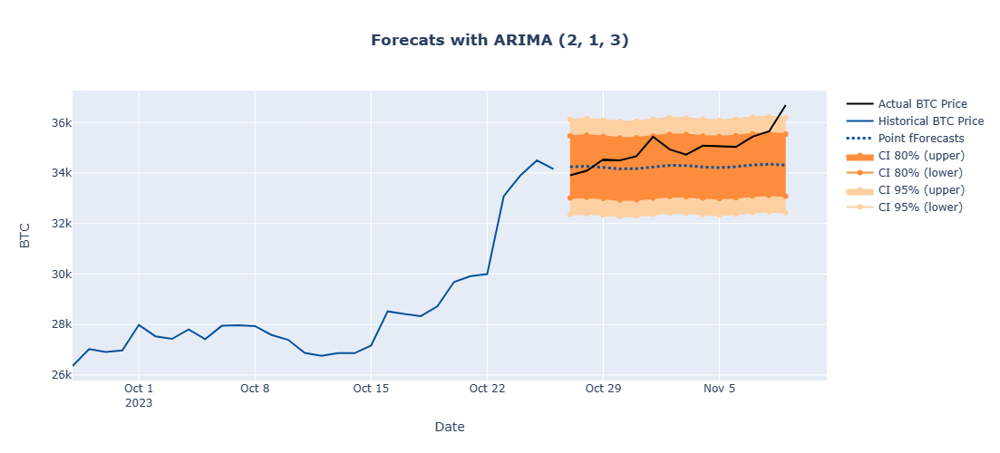

In [78]:
# Plot ARIMA forecasts
plot_forecasts(test_data[['Price']].iloc[-30:],ARIMA_forecasts_pd,ARIMA_CI_95_lower,ARIMA_CI_95_upper,
               ARIMA_CI_80_lower,ARIMA_CI_80_upper,f"Forecats with ARIMA {ARIMA_model.order}",height=500)

The plot shows that the mean forecasts look very similar to what we would get with a random walk. That is, including include AR and MA terms (p=3 and q=2) has made little difference to the point forecasts.

# Time series forecasting with deep learning models using Tensorflow

In the previous sections we have used classical approaches to time series forecasting: MA, exponential smoothing and ARIMA models. 

In this section, we will be building a variety of deep learning models (including Linear, CNN and RNN models) to make time series predictions using a window of $p$ successive values of the data. 

A deep learning model with $p$ lagged inputs and $0$ nodes in the hidden layer is equivalent to an ARIMA(p,0,0).

>While moving averages, exponential smoothing and Arima can only use **univariate** time series, deep learning models can use **multivariate** time series.

## Feature engineering

To identify potential trend changes, We will feed our models with the following key features:

1. Moving Average Convergence Divergence [MACD](https://en.wikipedia.org/wiki/MACD) which is commoly calculated by subtracting the 26-period EMA from the 12-period EMA.

    We can use the [exponentially weighted mean (ewm)](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.ewm.html) function from the Pandas library as shown in the snippet below:

2. The [block reward size](https://www.investopedia.com/terms/b/block-reward.asp), which is the number of bitcoins awarded for mining a block of bitcoin, as halving this factor is associated with price increases, as shown in the next chart.

#### MACD
We will be leveraging the [exponentially weighted mean (ewm)](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.ewm.html) function from Pandas library.

In [80]:
def calculate_MACD(series,a=12,b=26,c=9,adjust=False):
  '''
   The most commonly used values are 12, 26, and 9 days, that is, MACD(12,26,9).
  '''

  # 1. Calculate the a-day EMA of the closing price
  EMA_a = series.ewm(span=a, adjust=adjust, min_periods=a).mean()

  # 2. Calculate the b-day EMA of the closing price
  EMA_b = series.ewm(span=b, adjust=adjust, min_periods=b).mean()

  # 3. Subtract the b-day EMA from the a-Day EMA to get the MACD
  MACD = EMA_a - EMA_b

  # 4. Calculate the c-Day EMA of the MACD 
  MACD_s = MACD.ewm(span=c, adjust=False, min_periods=c).mean()

  # 5. Calculate the difference between the MACD - MACD_s for the Convergence/Divergence value
  MACD_h = MACD - MACD_s

  return EMA_a,EMA_b,MACD,MACD_s,MACD_h

## Scaling

As the features (Price, MACD, block reward) dont have the same range, it is important to scale them before training our neural network.

A common way to scale them is the MinMaxScaler which translates each feature to the range of 0 and 1. This transformation should be computed using only the training dataset as follows:

In [81]:
def MinMaxScaler(df,SPLIT_SIZE=0.8):
    '''The min and max are calculated using only the train data set.'''
    n = len(df)
    
    train_df = df[0:int(n*SPLIT_SIZE)]
    train_min = train_df.min()
    train_max = train_df.max()
    
    df = (df - train_min) / (train_max-train_min) 
    return df,train_min,train_max

## Put it all together
let's create a function `featureEng_and_Scaling` to:
1. feature engineering
2. train_test_split
3. MinMaxscaling

In [175]:
def featureEng_and_Scaling(initail_df,train_test_split=True,SPLIT_SIZE=0.8,drop_High_Open_Low=True):
    '''
    feature engineering:  block_reward + RSI + MACD
    params:
        - initail_df (DF): the initial dataframe contating the price BTC
        - train_test_split (boolean): apply train_test_split or not
        - SPLIT_SIZE (int)
        - drop_High_Open_Low (bbolean): if True, drop High, Low and Open columns
    '''
    bitcoin_data = initail_df.copy()
    
    # 1. block_reward
    
    bitcoin_data["block_reward"] = 0
    
    block_reward_1 = (50, np.datetime64("2009-01-03")) # 1st halphing data  
    block_reward_2 = (25, np.datetime64("2012-11-28")) # 2nd halphing data  
    block_reward_3 = (12.5, np.datetime64("2016-07-09"))# 3d  halphing data  st halphing data  
    block_reward_4 = (6.25, np.datetime64("2020-05-11")) # 4th halphing data  
    
    initial_date = bitcoin_data.index[0]
    block_reward_2_days = (block_reward_3[1] - initial_date).days
    block_reward_3_days = (block_reward_4[1] - initial_date).days
    
    # Set values of block_reward column 
    bitcoin_data.iloc[:block_reward_2_days, -1] = block_reward_2[0]
    bitcoin_data.iloc[block_reward_2_days:block_reward_3_days, -1] = block_reward_3[0]
    bitcoin_data.iloc[block_reward_3_days:, -1] = block_reward_4[0]
    
    # 2. MACD
    EMA_12,EMA_26,MACD,MACD_s,MACD_h = calculate_MACD(bitcoin_data['Price'],a=12,b=26,c=9,adjust=False)    
    bitcoin_data['MACD'] = bitcoin_data.index.map(MACD)
    
    bitcoin_data.dropna(inplace=True)

    # 3. Drop columns: High, Low, Open
    if drop_High_Open_Low:
        bitcoin_data = bitcoin_data.drop(['High','Low','Open'],axis=1)

    # 4. train test_split
    if train_test_split:
        n = len(bitcoin_data)    
        train_df = bitcoin_data[0:int(n*SPLIT_SIZE)] # data scaling will use only training dataset
        data_min = train_df.min()
        data_max = train_df.max()
       
    else:
        data_min = bitcoin_data.min()
        data_max = bitcoin_data.max()
 
    # 5. Scaling the data (MinMaxscaler)
    bitcoin_data_norm = bitcoin_data.copy()
    bitcoin_data_norm = (bitcoin_data - data_min) / (data_max-data_min) 
    
    # 7. set the label to predict (ie. the scaled price)
    # That is, our neural networks will predict the scaled prices. 
    bitcoin_data_norm['label'] =bitcoin_data_norm['Price'] 
    
    return bitcoin_data,bitcoin_data_norm,data_min,data_max

In [176]:
bitcoin_data,bitcoin_data_norm,train_min,train_max = featureEng_and_Scaling(bitcoin_prices,train_test_split=True)
bitcoin_data_norm.describe()

,Price,Volume,block_reward,MACD,label
count,2113.000000,2113.000000,2113.000000,2113.000000,2113.000000
mean,0.282376,0.064667,0.395173,0.495162,0.282376
std,0.248732,0.054446,0.489003,0.113326,0.248732
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.077496,0.026503,0.000000,0.453898,0.077496
50%,0.211111,0.056884,0.000000,0.487439,0.211111
75%,0.422953,0.089990,1.000000,0.528704,0.422953
max,1.000000,1.000000,1.000000,1.000000,1.000000


That is, our neural network will predict the scaled prices (`label` column). To get back to real BTC prices, we can use the following code:

##### Scaled price predictions:

preds = tf.squeeze(model.predict(test_dataset,verbose=0))

##### Get back to real BTC prices:

preds_BTC = (train_max['Price']-train_min['Price'])*preds+train_min['Price']

### Correlation Matrix

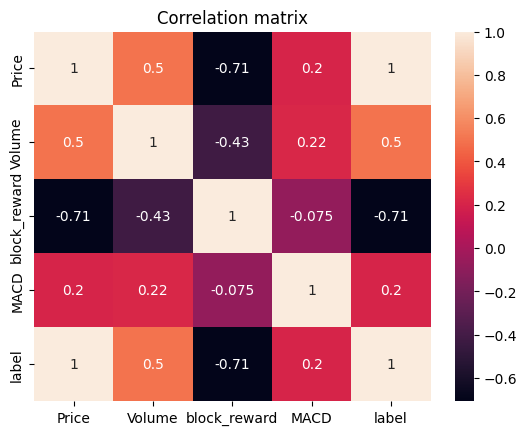

In [180]:
# Correlation Matrix
sns.heatmap(bitcoin_data_norm.corr(),annot=True)
plt.title("Correlation matrix");

### Price vs Block reward

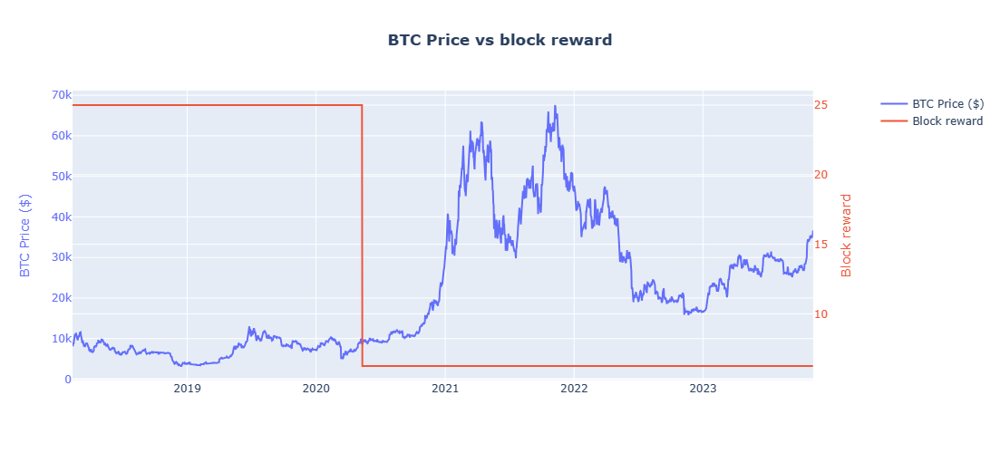

In [85]:
# Block reward vs Price

import plotly.graph_objects as go
from plotly.subplots import make_subplots

fig = make_subplots(specs=[[{"secondary_y": True}]])

fig.add_trace(
    go.Scatter(x=bitcoin_data.index, y=bitcoin_data.Price, 
               name="BTC Price ($)"
              ),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=bitcoin_data.index, y=bitcoin_data.block_reward, 
               name="Block reward"
              ),
    secondary_y=True,
)

# Add figure title
fig.update_layout(title_text="<b>BTC Price vs block reward</b>",title_x=0.5,height=500)

# Set y-axes titles & colors
fig.update_yaxes(title_text="BTC Price ($)",color = "#636EFA",secondary_y=False)
fig.update_yaxes(title_text="Block reward", color = '#EF553B',secondary_y=True)

fig.show();

## WINDOWING

Windowing is used to turn a time series dataset into _supervised learning problem_.

We need to set two hyperparameters:
* `HORIZON`: number of timesteps to predict into future;
* `WINDOW_SIZE`: number of timesteps or lags from past used to predict HORIZON.

For example, with a horizon of 1 and a window size of 7, we can predict the scaled price based on the previous week's values.

In [86]:
def make_windows(x, window_size=1, horizon=1):
    '''Make windows and labels using a multivariate time series.
    Inputs:
        - window_size (int): the window size
        - horizon (int): number of steps to be forecasted, default = 1, ie. one-step forecast.
    '''
    
    # 1. Window steps
    window_step = np.expand_dims(np.arange(window_size+horizon), axis=0)
    
    # 2. window indexes
    window_indexes = window_step + np.expand_dims(np.arange(len(x)-(window_size+horizon-1)), axis=0).T 
 
    # 3. Return window and horizon lists
    windows_list = []
    horizons_list = []
    for k in np.arange(len(window_indexes)):
        w,h = window_indexes[k][:-horizon], window_indexes[k][-horizon:]
        windows_list.append(x.iloc[w,:-1].values) # -1: because the last column is the label
        horizons_list.append(x.iloc[h,-1:].values) 

    windows = np.array(windows_list)
    labels = np.squeeze(np.array(horizons_list))   
    
    return windows,labels

### Multivariate time series train test split

In [184]:
def make_train_test_splits(windows, labels, test_split):
  """
  Splits matching pairs of windows and labels into train and test splits.
  """
  split_size = int(len(windows) * (1-test_split)) # this will default to 80% train/20% test
  train_windows = windows[:split_size]
  train_labels = labels[:split_size]
  test_windows = windows[split_size:]
  test_labels = labels[split_size:]
  return train_windows, test_windows, train_labels, test_labels

# train_windows, test_windows, train_labels, test_labels = make_train_test_splits(windows, labels, test_split=0.2)
# train_windows.shape, test_windows.shape, train_labels.shape, test_labels.shape

## Put it all together

In [183]:
def preprocess_data(df,WINDOW_SIZE=7,HORIZON=1,train_test_split=True,train_size=0.8,BATCH_size=32,show_shapes=True):
    '''
    preprocess_data includes:
        1. Windowing;
        2. train_test_split;
        3. Create tf.data.Dataset
    '''

    # 1. Windowing
    windows,labels = make_windows(bitcoin_data_norm, window_size=WINDOW_SIZE, horizon=HORIZON)

    dataset_all = tf.data.Dataset.from_tensor_slices((windows,labels)).shuffle(1000).batch(BATCH_size).prefetch(tf.data.AUTOTUNE)

    # 2. train_test_split

    if train_test_split:
        train_windows, test_windows, train_labels, test_labels = make_train_test_splits(windows, labels, test_split=0.2)
    
        if show_shapes:
            print("train_windows shape:", train_windows.shape)
            print("train_labels shape:", train_labels.shape)
            print("test_windows shape:", test_windows.shape)
            print("test_labels shape:", test_labels.shape)
    
        # 3. Create tf.data.Datasets
        train_dataset = tf.data.Dataset.from_tensor_slices((train_windows,train_labels)).shuffle(1000).batch(BATCH_size).prefetch(tf.data.AUTOTUNE)
        test_dataset = tf.data.Dataset.from_tensor_slices((test_windows,test_labels)).batch(BATCH_size).prefetch(tf.data.AUTOTUNE)
    else:
        train_windows,train_labels,test_windows,test_labels,train_dataset,test_dataset = (None,None,None,None,None,None)
        
    return train_windows,train_labels,test_windows,test_labels,train_dataset,test_dataset,dataset_all

## Modelling and Evaluation

Model structure:
```
Input (windowed dataset) -> Custom_Layers -> Output (BTC price)
```

The main component we'll be changing throughout is the `Custom_Layers` component.\
More specifically, we'll be building the following:
* **Model 1**: Dense model
* **Model 2**: LSTM model
* **Model 3**: GRU model
* **Ensemble** (multiple models optimized on different loss functions)


In [91]:
def build_model(model_layers_,model_name,loss_function,WINDOW_SIZE=7,HORIZON=1,show_summary=True,num_features=1,
               optimizer = keras.optimizers.Adam()):
    # num_features = X_train.shape[-1] # if univariate then num_features==1 else num_features== number features 
    
    tf.random.set_seed(42)
    # inputs = layers.Input(shape=(num_features,))
    inputs = layers.Input(shape=(WINDOW_SIZE,num_features))
    x = inputs
    for layer in model_layers_:
        x = layer(x)
        
    outputs = layers.Dense(HORIZON,activation="linear")(x)
    model = keras.Model(inputs,outputs,name=model_name)
    
    model.compile(loss = loss_function,
                   optimizer=keras.optimizers.Adam(),
                   metrics=["mae","mse"])
    if show_summary:
        model.summary()  
        
    return model


def train_model(model,train_dataset,test_dataset,
                epochs,monitor='val_loss',                
                is_early_stopping=True,early_stopping_patience=4,
                is_reduce_lr=True,reduce_lr_patience=3,
                save_history=True,VERBOSE='auto'):
    
    # 1. Callbacks
    early_stopping = keras.callbacks.EarlyStopping(patience=early_stopping_patience,monitor=monitor, 
                                                   verbose=1,
                                                   restore_best_weights=True)
    
    reduce_lr = keras.callbacks.ReduceLROnPlateau(patience=reduce_lr_patience,monitor=monitor, factor=0.2,min_lr=1e-7)

    # callbacks_list = [model_ckpt]    
    callbacks_list = []
    if is_early_stopping:
        callbacks_list.append(early_stopping)
    if is_reduce_lr:
        callbacks_list.append(reduce_lr)
    
    # 2. Train the model
    if test_dataset is None: # Fit with no validation_data
        history = model.fit(train_dataset,epochs=epochs,
                            callbacks=callbacks_list,
                            verbose=VERBOSE)
    else: # fit with validation_data
        history = model.fit(train_dataset,epochs=epochs,
                            validation_data=test_dataset,
                            callbacks=callbacks_list,
                            verbose=VERBOSE)
    # save history
    if save_history:
        pd.DataFrame(history.history).to_csv("./stats/history_"+model.name+".csv",index=False)
    
    return history



def plot_metrics(history,model_name,list_metrics=['loss','mse'],plot_validation=True):
    """Plot loss curves"""
    for metric in list_metrics:        
        epochs = np.arange(len(history.history[metric]))
        fig = go.Figure()

        # 1. Plot training curves 
        train_metric = history.history[metric]
        fig.add_trace(go.Scatter(x=epochs, y=train_metric,
                                         mode='lines+markers',
                                         name=f"training_{metric}"))

        # 2. Plot validation curves
        if plot_validation: 
            val_metric = history.history[f"val_{metric}"]
            fig.add_trace(go.Scatter(x=epochs, y=val_metric,
                                             mode='lines+markers',
                                             name=f"val_{metric}"))
        # 3. Update layout
        fig.update_layout(title_text=f"<b>{str.upper(metric)} - {model_name}</b>",title_x=0.5,
                          xaxis_title='Epochs',
                          yaxis_title="",
                          height=500)
        fig.show()

Now, let's create a function to find the optimal window size.

In [92]:
def search_optimal_window_size(model_layers_list,model_name,
                               list_Window_size=range(1,33,2),
                               loss_function="mae",                         
                               HORIZON=1,EPOCHS=100,
                               show_shapes=False,
                               show_results=False,
                               show_summary=False):
    tf.random.set_seed(42)

    MAE_list = []
    RMSE_list = []
    MAPE_list = []
    r2_score_list = []
    
    for k,window_size in enumerate(list_Window_size):
        tf.random.set_seed(42)
        print(f"Window_size = {window_size} ...")
  
        # 1. process data
        X_train,y_train,X_test,y_test,train_dataset,test_dataset,_ = preprocess_data(bitcoin_data_norm,WINDOW_SIZE=window_size,
                                                                                      HORIZON=HORIZON,show_shapes=show_shapes)
        num_features = X_train.shape[-1]
        
        # 2. Build the model
        tf.random.set_seed(42)
        model = build_model(model_layers_list[k],model_name,loss_function=loss_function,
                            WINDOW_SIZE=window_size,HORIZON=HORIZON,
                            show_summary=show_summary,num_features=num_features)
        
        # 3. Train the model
        train_model(model,train_dataset,test_dataset,epochs=EPOCHS,save_history=False,VERBOSE=0)

        # 4. Make preds (normalized prices) and convert them into real BTC prices
        preds = tf.squeeze(model.predict(test_dataset,verbose=0)) # normalized prices
        
        # MinMax scaler
        preds = (train_max['Price']-train_min['Price'])*preds+train_min['Price']
        y_test = (train_max['Price']-train_min['Price'])*y_test+train_min['Price']

        # 5. Evaluate the model        
        metrics_model = evaluate_model(y_test, preds,model_name,show_results=show_results)
        MAE_list.append(metrics_model['MAE'])
        RMSE_list.append(metrics_model['RMSE'])
        MAPE_list.append(metrics_model['MAPE'])
        r2_score_list.append(metrics_model['r2_score'])

    return MAE_list,RMSE_list,MAPE_list,r2_score_list
        
    print("\n\nend.")

### Model1: Dense model

In [109]:
list_Window_size  = np.arange(1,33,2)
start_time = time.time()

print("Search optimal window size for multivaritae Dense model\n")
model_layers_list = []
for _ in range(len(list_Window_size)):
    model_layers_list.append([layers.Flatten(),
                              layers.Dense(32)
                             ])
    
MAE_DENSE,RMSE_DENSE,MAPE_DENSE,r2_score_DENSE = search_optimal_window_size(model_layers_list,"model_Dense",
                                                                            list_Window_size=list_Window_size,show_results=False)

end_time = time.time()
print("\n\n Run time:",round((end_time-start_time)/60,1),"minutes")

# save results to CSV file.
stats_Dense_perWS = pd.DataFrame({"MAE":MAE_DENSE,
                                  "RMSE":RMSE_DENSE,
                                  "MAPE":MAPE_DENSE,
                                  "r2_score":r2_score_DENSE,
                                  "window_size":list_Window_size,
                                  "model":["Dense" for _ in range(len(list_Window_size))]})
stats_Dense_perWS.to_csv("./stats/stats_Dense_WindowSize.csv",index=False)

Search optimal window size for multivaritae Dense model

Window_size = 1 ...
Restoring model weights from the end of the best epoch: 11.
Epoch 15: early stopping
model_Dense evaluation metrics:
RMSE: 570.1195
MAE: 370.2389
MAPE: 0.0152
R2_score: 0.987
Window_size = 3 ...
Restoring model weights from the end of the best epoch: 20.
Epoch 24: early stopping
model_Dense evaluation metrics:
RMSE: 701.6121
MAE: 453.2923
MAPE: 0.0187
R2_score: 0.9803
Window_size = 5 ...
Restoring model weights from the end of the best epoch: 31.
Epoch 35: early stopping
model_Dense evaluation metrics:
RMSE: 642.2967
MAE: 412.8248
MAPE: 0.017
R2_score: 0.9835
Window_size = 7 ...
Restoring model weights from the end of the best epoch: 27.
Epoch 31: early stopping
model_Dense evaluation metrics:
RMSE: 647.0054
MAE: 425.872
MAPE: 0.0176
R2_score: 0.9833
Window_size = 9 ...
Restoring model weights from the end of the best epoch: 18.
Epoch 22: early stopping
model_Dense evaluation metrics:
RMSE: 804.5424
MAE: 545.7

### Model2: LSTM model

In [110]:
# Search optimal window size - LSTM model

list_Window_size  = np.arange(1,33,2)
start_time = time.time()

print("\n\nSearch optimal window size for multivaritae LSTM model")
model_layers_list = []
for _ in range(len(list_Window_size)):
    model_layers_list.append([layers.LSTM(32,activation="relu")
                             ])
    
MAE_LSTM,RMSE_LSTM,MAPE_LSTM,r2_score_LSTM = search_optimal_window_size(model_layers_list,"model_LSTM",
                                                                        list_Window_size=list_Window_size,show_results=False)

end_time = time.time()
print("\n\n Run time:",round((end_time-start_time)/60,1),"minutes")

# save results to CSV file.
stats_LSTM_perWS = pd.DataFrame({"MAE":MAE_LSTM,
                                 "RMSE":RMSE_LSTM,
                                 "MAPE":MAPE_LSTM,
                                 "r2_score":r2_score_LSTM,
                                 "window_size":list_Window_size,
                                 "model":["LSTM" for _ in range(len(list_Window_size))]})
stats_LSTM_perWS.to_csv("./stats/stats_LSTM_WindowSize.csv",index=False)



Search optimal window size for multivaritae LSTM model
Window_size = 1 ...
Restoring model weights from the end of the best epoch: 16.
Epoch 20: early stopping
model_LSTM evaluation metrics:
RMSE: 770.6972
MAE: 612.2787
MAPE: 0.0253
R2_score: 0.9763
Window_size = 3 ...
Restoring model weights from the end of the best epoch: 19.
Epoch 23: early stopping
model_LSTM evaluation metrics:
RMSE: 724.7099
MAE: 483.021
MAPE: 0.0199
R2_score: 0.979
Window_size = 5 ...
Restoring model weights from the end of the best epoch: 23.
Epoch 27: early stopping
model_LSTM evaluation metrics:
RMSE: 840.0704
MAE: 565.8924
MAPE: 0.0234
R2_score: 0.9718
Window_size = 7 ...
Restoring model weights from the end of the best epoch: 9.
Epoch 13: early stopping
model_LSTM evaluation metrics:
RMSE: 1126.9615
MAE: 862.708
MAPE: 0.0361
R2_score: 0.9493
Window_size = 9 ...
Restoring model weights from the end of the best epoch: 19.
Epoch 23: early stopping
model_LSTM evaluation metrics:
RMSE: 840.7127
MAE: 555.1409
M

### Model3: GRU model

In [111]:
# Search optimal window size - GRU model

list_Window_size  = np.arange(1,33,2)
start_time = time.time()

print("\n\nSearch optimal window size for multivaritae GRU model...")
model_layers_list = []
for _ in range(len(list_Window_size)):
    model_layers_list.append([
                              #layers.Lambda(lambda x: tf.expand_dims(x, axis=1)),
                              layers.GRU(32,activation="tanh")])
    
MAE_GRU,RMSE_GRU,MAPE_GRU,r2_score_GRU = search_optimal_window_size(model_layers_list,"model_GRU",
                                                                    list_Window_size=list_Window_size,show_results=False)

end_time = time.time()
print("\n\n Run time:",round((end_time-start_time)/60,1),"minutes")

# save results to CSV file.
stats_GRU_perWS = pd.DataFrame({"MAE":MAE_GRU,
                                "RMSE":RMSE_GRU,
                                "MAPE":MAPE_GRU,
                                "r2_score":r2_score_GRU,
                                "window_size":list_Window_size,
                                "model":["GRU" for _ in range(len(list_Window_size))]})
stats_GRU_perWS.to_csv("./stats/stats_GRU_WindowSize.csv",index=False)



Search optimal window size for multivaritae GRU model...
Window_size = 1 ...
Restoring model weights from the end of the best epoch: 9.
Epoch 13: early stopping
model_GRU evaluation metrics:
RMSE: 575.6945
MAE: 380.1397
MAPE: 0.0158
R2_score: 0.9868
Window_size = 3 ...
Restoring model weights from the end of the best epoch: 14.
Epoch 18: early stopping
model_GRU evaluation metrics:
RMSE: 685.5202
MAE: 431.4674
MAPE: 0.0178
R2_score: 0.9812
Window_size = 5 ...
Restoring model weights from the end of the best epoch: 22.
Epoch 26: early stopping
model_GRU evaluation metrics:
RMSE: 666.6623
MAE: 423.9492
MAPE: 0.0175
R2_score: 0.9822
Window_size = 7 ...
Restoring model weights from the end of the best epoch: 20.
Epoch 24: early stopping
model_GRU evaluation metrics:
RMSE: 676.5783
MAE: 432.6201
MAPE: 0.0178
R2_score: 0.9817
Window_size = 9 ...
Restoring model weights from the end of the best epoch: 18.
Epoch 22: early stopping
model_GRU evaluation metrics:
RMSE: 661.2596
MAE: 424.8367
MA

### Model4: Conv1D model

In [112]:
# Search optimal window size - Conv1D model

list_Window_size  = np.arange(1,33,2)
start_time = time.time()

print("\n\nSearch optimal window size for multivaritae Conv1D model...")
model_layers_list = []
for _ in range(len(list_Window_size)):
    model_layers_list.append([layers.Conv1D(32,5,padding="causal"),
                              layers.Flatten()])
    
MAE_Conv1D,RMSE_Conv1D,MAPE_Conv1D,r2_score_Conv1D = search_optimal_window_size(model_layers_list,"model_Conv1D",
                                                                                list_Window_size=list_Window_size,show_results=False)

end_time = time.time()
print("\n\n Run time:",round((end_time-start_time)/60,1),"minutes")

# save results to CSV file.
stats_Conv1D_perWS = pd.DataFrame({"MAE":MAE_Conv1D,
                                  "RMSE":RMSE_Conv1D,
                                  "MAPE":MAPE_Conv1D,
                                   "r2_score":r2_score_Conv1D,
                                  "window_size":list_Window_size,
                                  "model":["Conv1D" for _ in range(len(list_Window_size))]})
stats_Conv1D_perWS.to_csv("./stats/stats_Conv1D_WindowSize.csv",index=False)



Search optimal window size for multivaritae Conv1D model...
Window_size = 1 ...
Restoring model weights from the end of the best epoch: 18.
Epoch 22: early stopping
model_Conv1D evaluation metrics:
RMSE: 569.4999
MAE: 369.7926
MAPE: 0.0152
R2_score: 0.987
Window_size = 3 ...
Restoring model weights from the end of the best epoch: 19.
Epoch 23: early stopping
model_Conv1D evaluation metrics:
RMSE: 710.1179
MAE: 449.5268
MAPE: 0.0185
R2_score: 0.9799
Window_size = 5 ...
Restoring model weights from the end of the best epoch: 48.
Epoch 52: early stopping
model_Conv1D evaluation metrics:
RMSE: 886.4162
MAE: 578.6243
MAPE: 0.0238
R2_score: 0.9686
Window_size = 7 ...
Restoring model weights from the end of the best epoch: 31.
Epoch 35: early stopping
model_Conv1D evaluation metrics:
RMSE: 888.104
MAE: 578.2653
MAPE: 0.0237
R2_score: 0.9685
Window_size = 9 ...
Restoring model weights from the end of the best epoch: 28.
Epoch 32: early stopping
model_Conv1D evaluation metrics:
RMSE: 722.8207

#### Compare models: plot MAE per window size 

In [117]:
stats_Dense_perWS = pd.read_csv("./stats/stats_Dense_WindowSize.csv")
stats_LSTM_perWS = pd.read_csv("./stats/stats_LSTM_WindowSize.csv")
stats_GRU_perWS = pd.read_csv("./stats/stats_GRU_WindowSize.csv")
stats_Conv1D_perWS = pd.read_csv("./stats/stats_Conv1D_WindowSize.csv")


list_Window_size = stats_Dense_perWS['window_size']

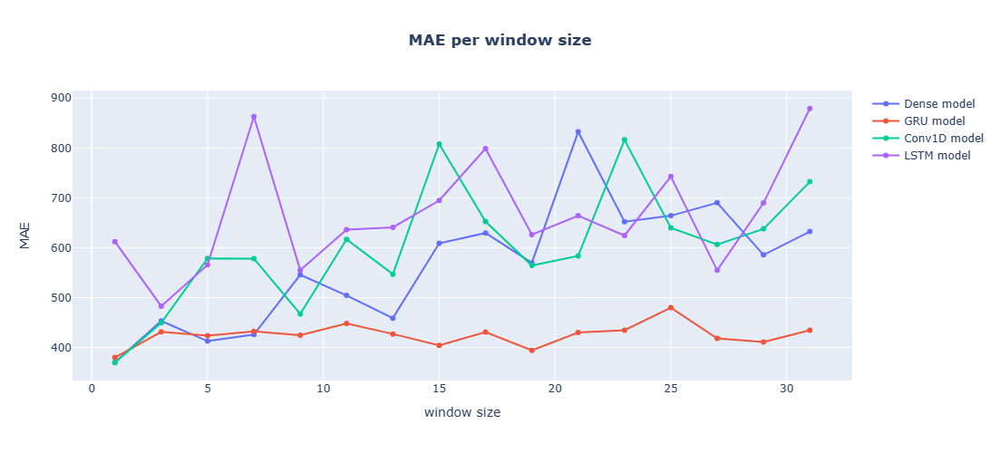

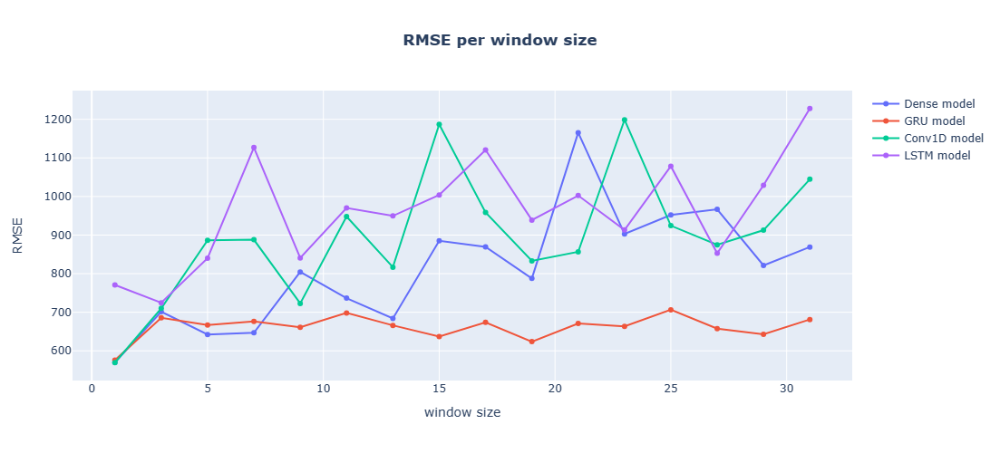

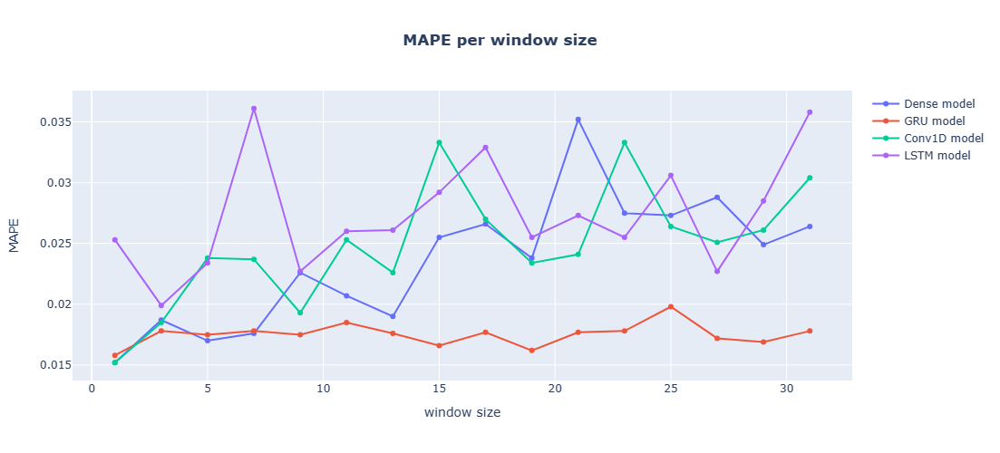

In [118]:
# Plot MAE, RMSE and MAPE per window size 
for metric in ["MAE","RMSE","MAPE"]:

    fig = go.Figure()
    fig.add_trace(go.Scatter(x=list_Window_size, y=stats_Dense_perWS[metric],
                             mode='lines+markers',
                             name='Dense model'))
    fig.add_trace(go.Scatter(x=list_Window_size, y=stats_GRU_perWS[metric],
                             mode='lines+markers',
                             name='GRU model'))
    fig.add_trace(go.Scatter(x=list_Window_size, y=stats_Conv1D_perWS[metric],
                             mode='lines+markers',
                             name='Conv1D model'))    
    fig.add_trace(go.Scatter(x=list_Window_size, y=stats_LSTM_perWS[metric],
                             mode='lines+markers',
                             name='LSTM model'))
    
    fig.update_layout(title_text=f"<b>{metric} per window size</b>",title_x=0.5,
                      xaxis_title='window size',
                      yaxis_title=f"{metric}",
                      height=500)
    fig.show()

Clearly, optimal window size for all deep learning models is 1.

In [169]:
# Compare all models created so far (Naive, MA, ExpSmoothing, ARIMA and Tensorflow models)

best_results_tensorflow = pd.concat([stats_Dense_perWS,stats_LSTM_perWS,stats_GRU_perWS,stats_Conv1D_perWS])\
                          .sort_values(by='MAE').drop_duplicates(['model']).set_index("model")

metrics_ExpSmoothing_DF = pd.read_csv("./stats/ExpSmoothing_metrics_WindowSize.csv")
best_results_ExpSmoothing = metrics_ExpSmoothing_DF[metrics_ExpSmoothing_DF['window_size']==712].drop("window_size",axis=1)
best_results_ExpSmoothing = best_results_ExpSmoothing.set_index("model_name")

results = pd.DataFrame([metrics_naive,metrics_MA_3_trailing]).set_index("model_name")
results = pd.concat([best_results_tensorflow,results,best_results_ExpSmoothing])

results = results.sort_values(by="MAE",ascending=True)[:-2]
results

,MAE,RMSE,MAPE,r2_score,window_size
Conv1D,369.7926,569.4999,0.0152,0.9870,1.0
Dense,370.2389,570.1195,0.0152,0.9870,1.0
Holt,376.8600,586.8700,0.0200,0.9800,NaN
SES,377.3000,586.4100,0.0200,0.9800,NaN
Holt_damped,377.6500,586.8700,0.0200,0.9800,NaN
Naive_Forecast,378.8500,586.3800,0.0200,0.9800,NaN
GRU,380.1397,575.6945,0.0158,0.9868,1.0


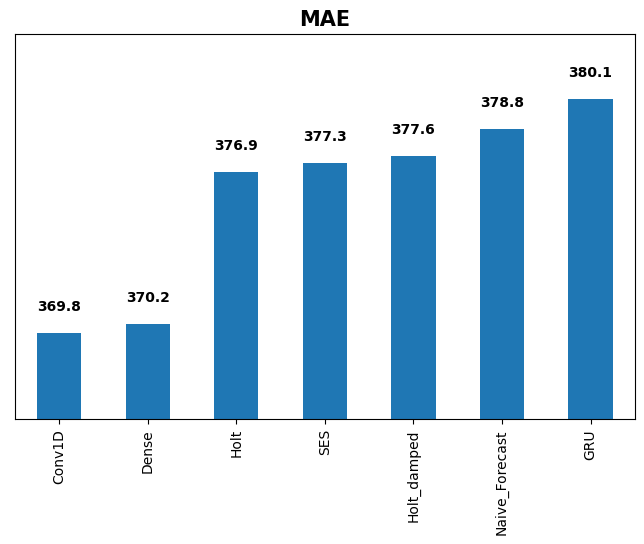

In [170]:
# plot results
_results = results[['MAE']].round(1)
_results.plot(figsize=(8, 5), kind="bar",legend=None) 
plt.ylim(int(_results.head(1).values[0][0])-3,int(results.tail(1).values[0][0])+3)
plt.title("MAE",fontsize = 15, weight='bold')
for i in range(len(_results.index)):
    plt.text(i,_results.MAE[i]+1,_results.MAE[i], ha = 'center', weight='bold')
plt.yticks([]);

plt.savefig("./DATA/20-MAE_models.png",bbox_inches='tight')

The Conv1D and Dense models (with one layer and 32 neurons) yield the best results with an MAE of 370, ahead of the SES and GRU models, with an MAE of 377.

# Conclusion

In this project, I have been forecasting a series of daily closing prices for Bitcoin.

I built a variety of models, from classics like <em>ARIMA</em> and <em>exponential smoothing</em> to deep
neural networks. The latter were used with multivariate time series, as in addition to the historical price of Bitcoin, we fed
them with other features such as MACD, which slightly improved the performance of our model.

I found that these models slightly outperformed the Naive model. This shows how difficult it is to make
            predictions in open systems like stock or crypto markets.
Throughout this project, I have used `pmdarima` and `Tensorflow`..

There are other libraries, such as `sktime`, `prophet` and `greykite` to name a few.